# 01_Data_Overview_EDA.ipynb

Advanced Exploratory Data Analysis (EDA) for Air Temperature Time Series Data.

Data source: ../data/surface-air-temperature-monthly-mean.csv

Technologies used: Pandas Profiling, Sweetviz, Plotly, D-Tale, Ydata Profiling, Missingno, PhiK.

This notebook includes basic and advanced usage of each technology, with time series-specific enhancements.

In [ ]:
# # Install required libraries (run this cell if not already installed)
# ! pip install pandas numpy matplotlib seaborn plotly pandas-profiling sweetviz dtale ydata-profiling missingno phik statsmodels

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from pandas_profiling import ProfileReport
import sweetviz as sv
import dtale
from ydata_profiling import ProfileReport as YProfileReport
import missingno as msno
import phik
from statsmodels.tsa.seasonal import seasonal_decompose

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('seaborn-v0_8')
sns.set_palette('husl')

C:\Users\soura\AppData\Local\Temp\ipykernel_18776\1274190585.py:8: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [2]:
# Load and preprocess the data
df = pd.read_csv('../data/surface-air-temperature-monthly-mean.csv')

# Convert month to datetime and set as index
df['month'] = pd.to_datetime(df['month'])
df.set_index('month', inplace=True)

# Add time series features
df['year'] = df.index.year
df['month_num'] = df.index.month
df['quarter'] = df.index.quarter
df['rolling_mean_12'] = df['mean_temp'].rolling(window=12).mean()
df['rolling_std_12'] = df['mean_temp'].rolling(window=12).std()

# Display basic info
print(df.head(15))
print(f"\nData shape: {df.shape}")
print(f"Date range: {df.index.min()} to {df.index.max()}")
print(df.describe())

            mean_temp  year  month_num  quarter  rolling_mean_12  \
month                                                              
1982-01-01       25.9  1982          1        1              NaN   
1982-02-01       27.1  1982          2        1              NaN   
1982-03-01       27.2  1982          3        1              NaN   
1982-04-01       27.0  1982          4        2              NaN   
1982-05-01       28.0  1982          5        2              NaN   
1982-06-01       28.4  1982          6        2              NaN   
1982-07-01       28.2  1982          7        3              NaN   
1982-08-01       27.7  1982          8        3              NaN   
1982-09-01       27.9  1982          9        3              NaN   
1982-10-01       27.4  1982         10        4              NaN   
1982-11-01       27.3  1982         11        4              NaN   
1982-12-01       26.2  1982         12        4        27.358333   
1983-01-01       26.5  1983          1        1 

## 1. Pandas Profiling
### Basic Usage: Automated EDA reports
### Advanced: Custom configurations and time series insights

In [3]:
# Basic Pandas Profiling report
profile = ProfileReport(df.reset_index(), title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 7/7 [00:00<00:00, 500.53it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
# Advanced: Custom configuration with correlations and time series focus
profile_advanced = ProfileReport(
    df.reset_index(),
    title="Advanced Pandas Profiling",
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": True},
        "kendall": {"calculate": True},
        "phi_k": {"calculate": True},
        "cramers": {"calculate": True},
    },
    interactions={"targets": ["mean_temp"]},
    missing_diagrams={
        "heatmap": True,
        "dendrogram": True,
        "matrix": True,
    },
    duplicates={"head": 10},
    samples={"head": 10, "tail": 10},
)
profile_advanced.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 7/7 [00:00<?, ?it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 2. Sweetviz
### Basic: Comparison-based EDA
### Advanced: Pairwise comparisons and target analysis

                                             |          | [  0%]   00:00 -> (? left)


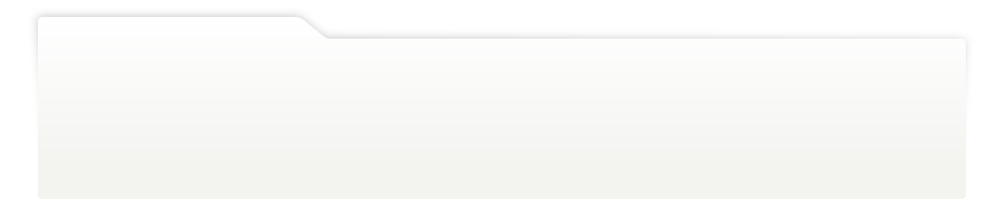
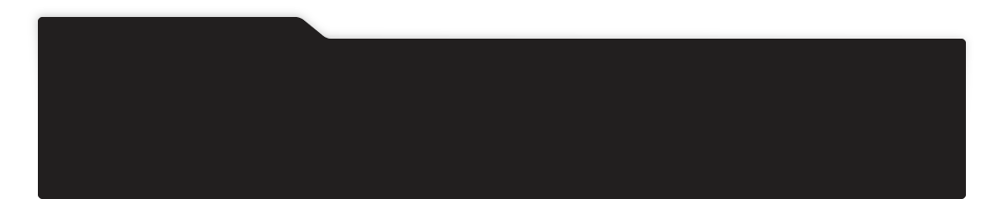
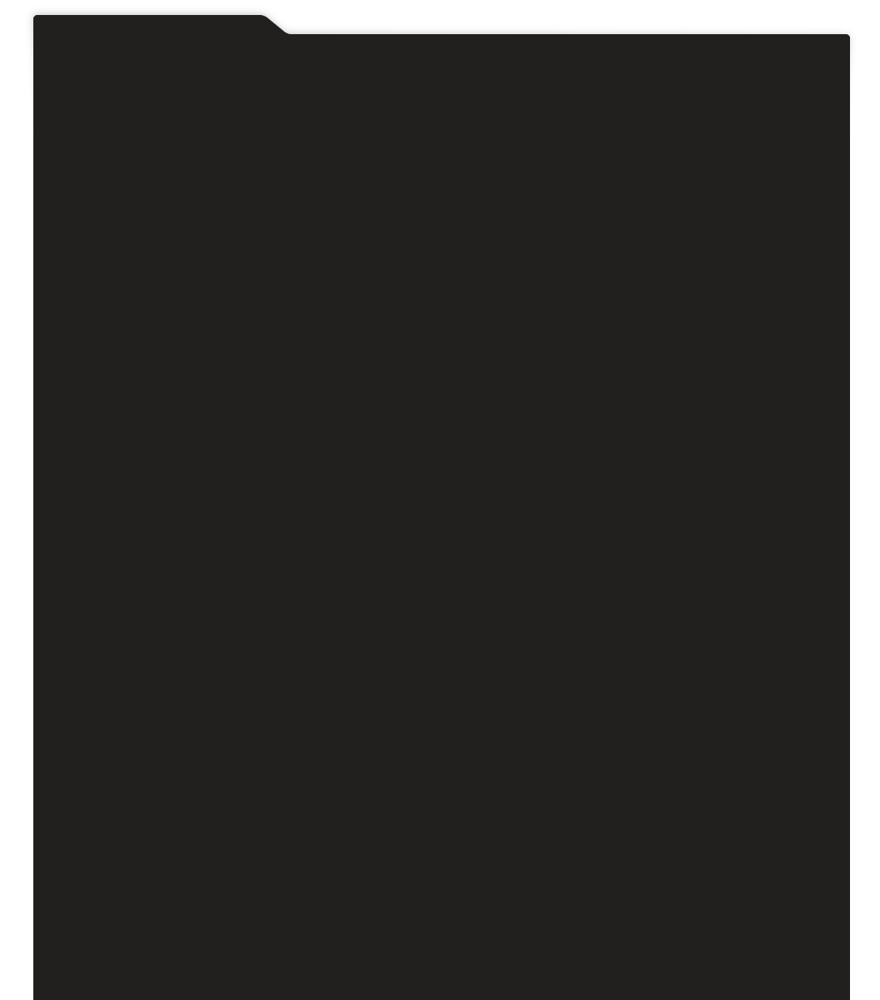
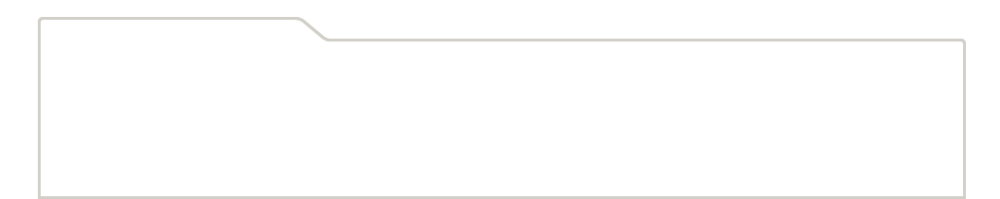
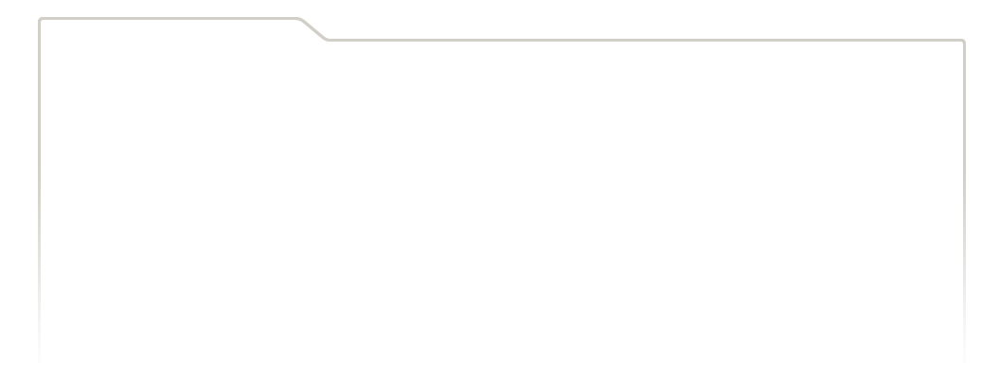
...
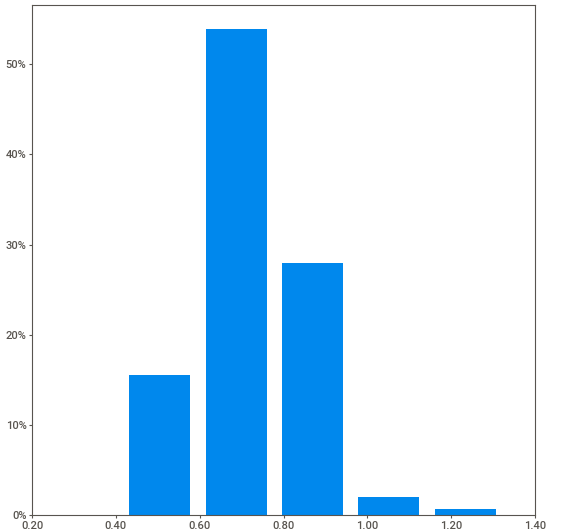
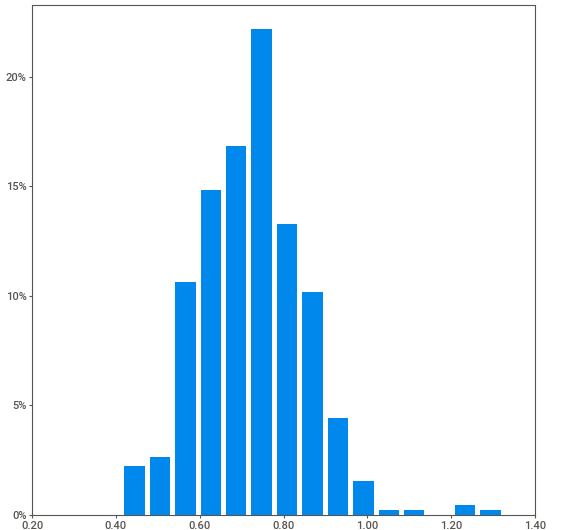
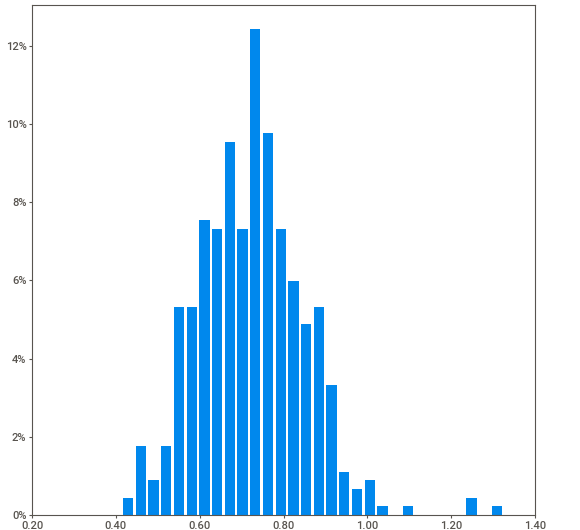
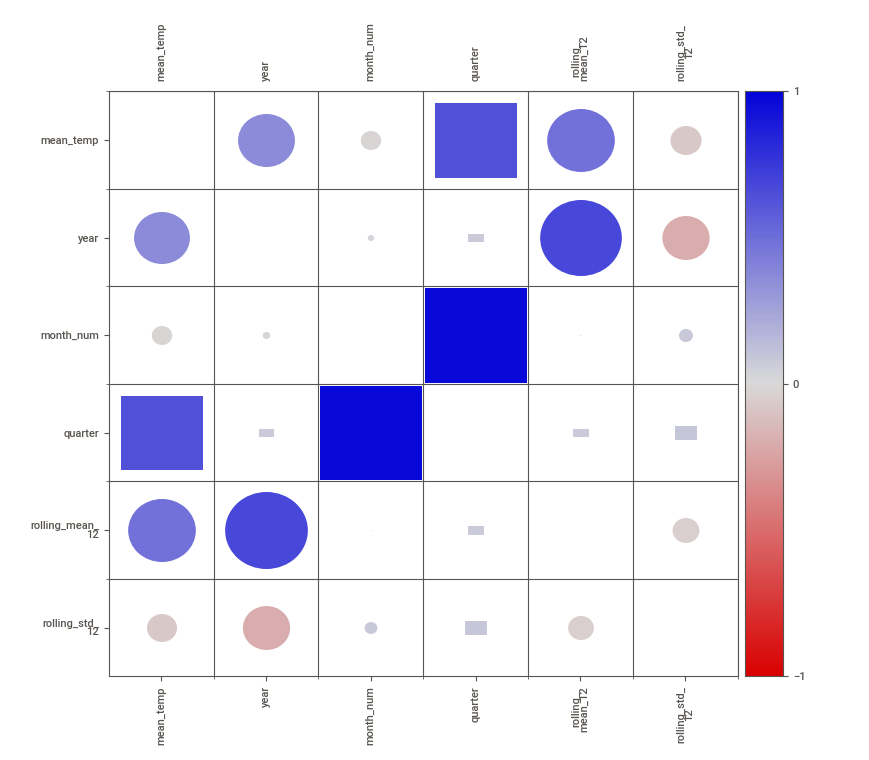
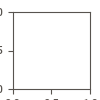

In [5]:
# Basic Sweetviz report
report = sv.analyze(df.reset_index())
report.show_notebook()

In [7]:
# Purpose: Make the code robust to different column names/cases and ensure datetime + year are present.

# If df is missing, try to use an existing variable in the notebook
if "df" not in locals() and "df" not in globals():
    raise RuntimeError("No dataframe named df found. Load your data into df or run the load cell.")

df_work = df.copy()

# Standardize column names (lowercase and strip)
df_work.columns = [c.strip().lower() for c in df_work.columns]

# Try to detect date and temperature columns
date_candidates = [c for c in df_work.columns if c in ["month", "date", "ds", "timestamp", "time", "datetime"]]
temp_candidates = [c for c in df_work.columns if c in ["mean_temp", "mean temperature", "meantemp", "avg_temp", "temperature", "temp", "y"]]

if not date_candidates:
    # If the index is datetime-like, use it
    if isinstance(df_work.index, pd.DatetimeIndex):
        df_work = df_work.reset_index().rename(columns={"index": "month"})
        date_col = "month"
    else:
        raise ValueError("Could not find a date-like column (month/date/ds). Please provide or rename one.")
else:
    date_col = date_candidates[0]

if not temp_candidates:
    # Try to infer a numeric column as the target if only one
    numeric_cols = df_work.select_dtypes(include=[np.number]).columns.tolist()
    if len(numeric_cols) == 1:
        temp_col = numeric_cols[0]
    else:
        raise ValueError("Could not find a temperature column. Expected mean_temp or similar.")
else:
    temp_col = temp_candidates[0]

# Parse datetime
df_work[date_col] = pd.to_datetime(df_work[date_col], errors="coerce")
df_work = df_work.dropna(subset=[date_col]).sort_values(date_col)
df_work = df_work.set_index(date_col)

# Coerce temperature to numeric
df_work[temp_col] = pd.to_numeric(df_work[temp_col], errors="coerce")

# Create a normalized schema for downstream code
df_work = df_work.rename(columns={temp_col: "mean_temp"})
df_work["year"] = df_work.index.year

print("Prepared dataframe with columns:", list(df_work.columns))
print("Index head:", df_work.index[:3])

Prepared dataframe with columns: ['mean_temp', 'year', 'month_num', 'quarter', 'rolling_mean_12', 'rolling_std_12']
Index head: DatetimeIndex(['1982-01-01', '1982-02-01', '1982-03-01'], dtype='datetime64[ns]', name='month', freq=None)


                                             |          | [  0%]   00:00 -> (? left)

Report sweetviz_compare_intra.html was generated.



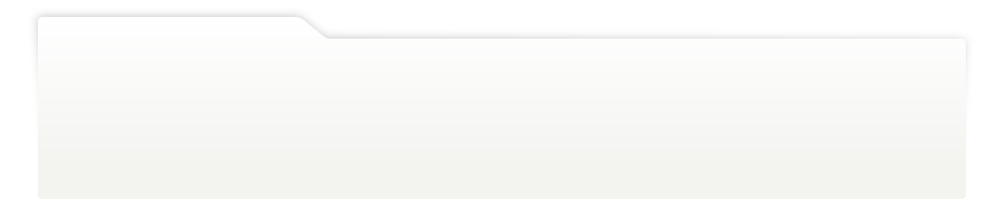
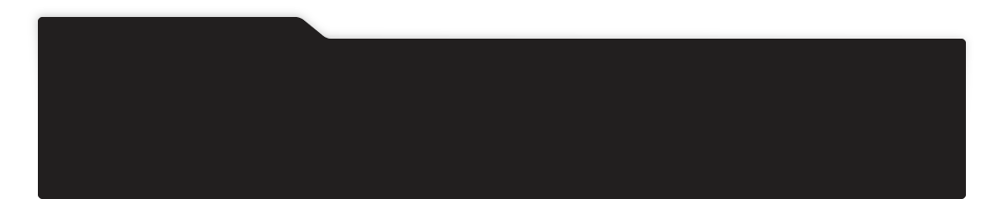
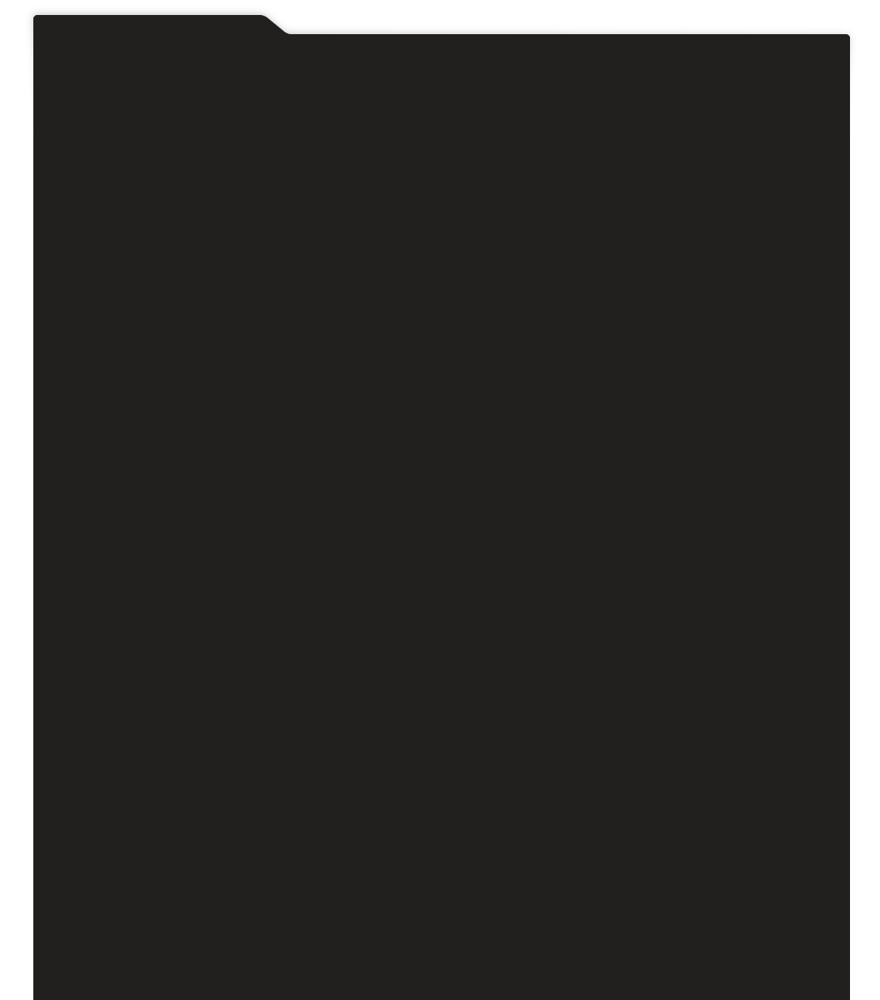
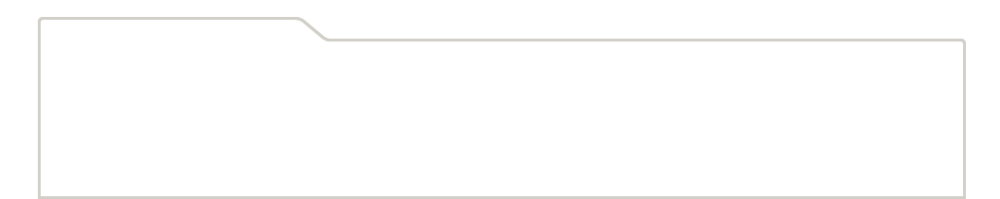
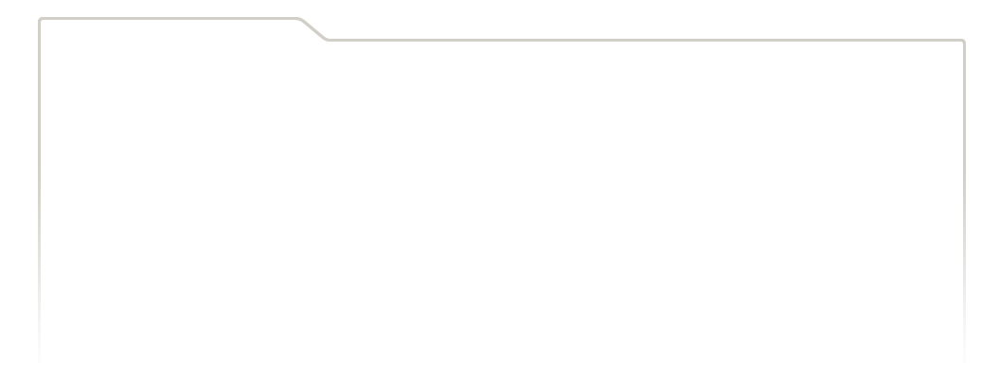
...
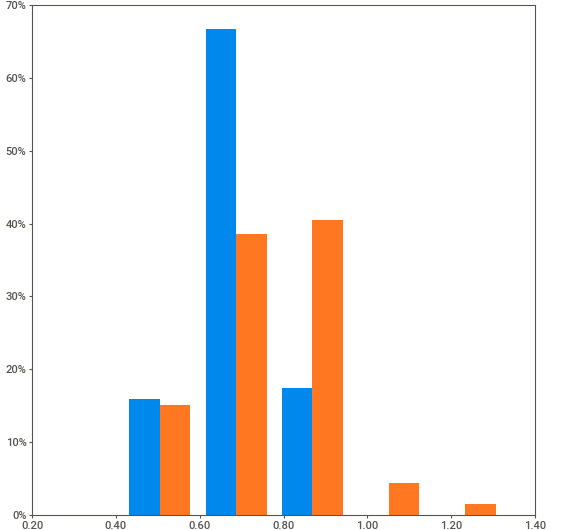
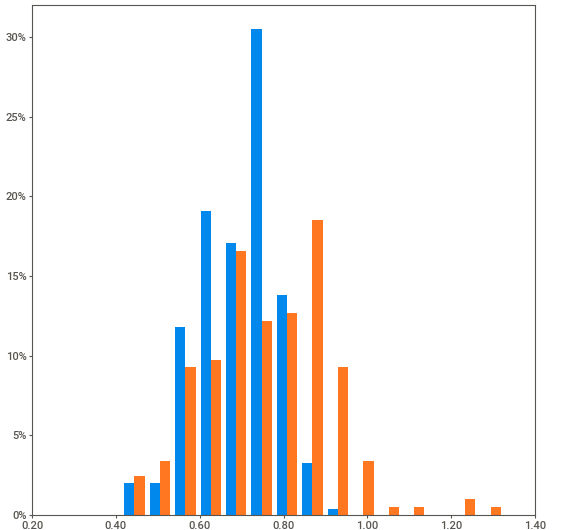
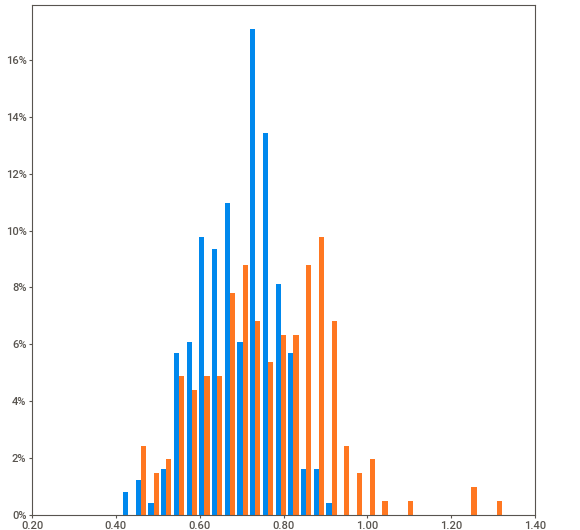
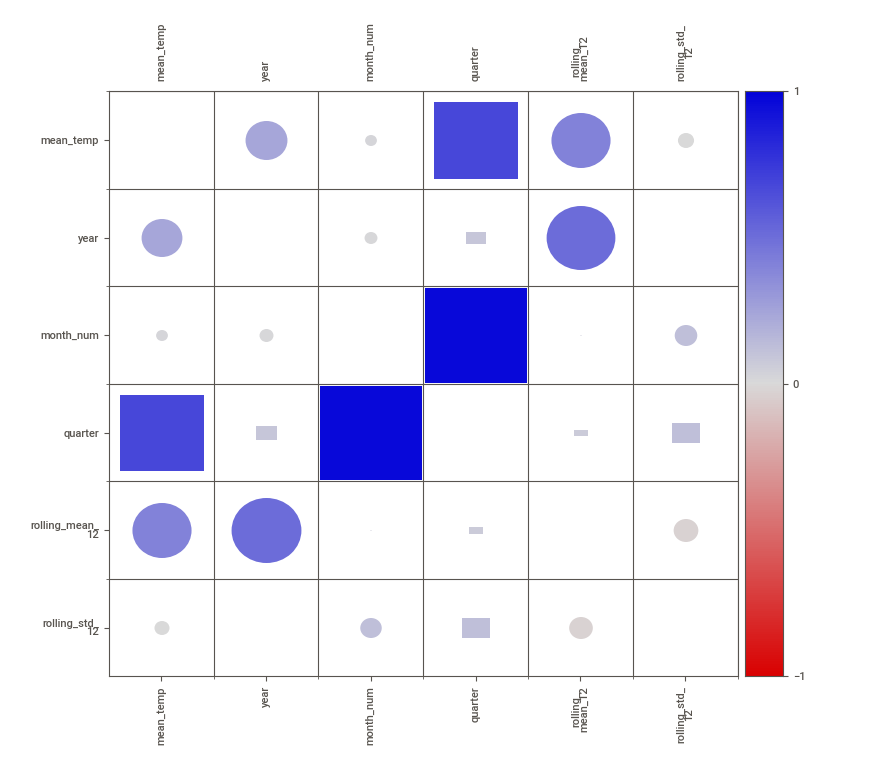
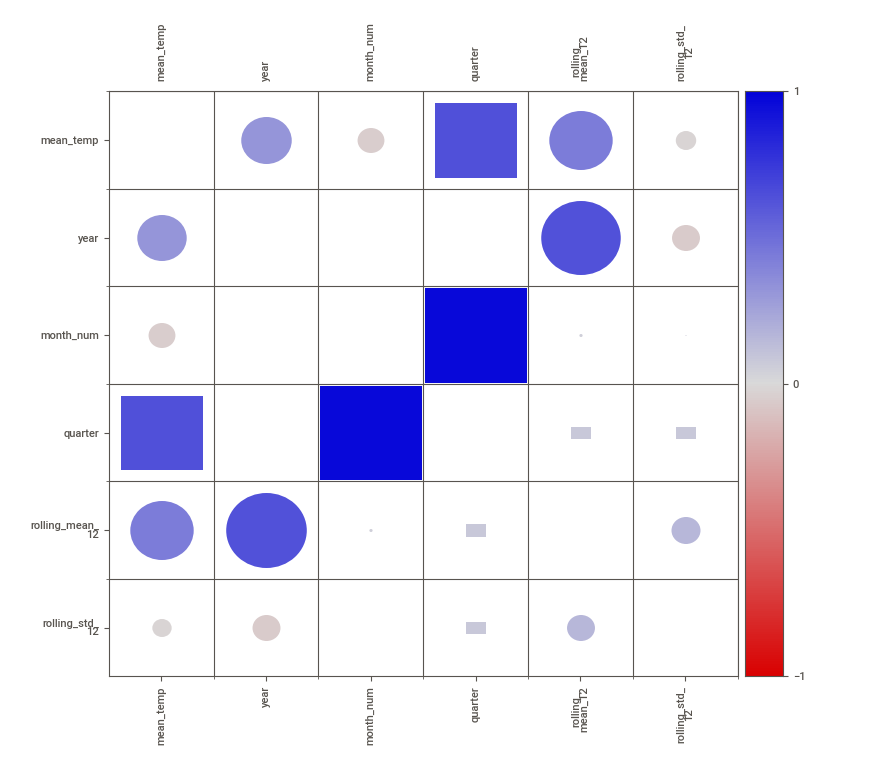

Generated Sweetviz intra report


In [8]:
# Purpose: Run Sweetviz compare_intra on year groups. Save HTML and (optionally) show notebook report.

# Ensure year exists and is numeric
if "year" not in df_work.columns:
    df_work["year"] = df_work.index.year

df_with_year = df_work.reset_index()
condition = df_with_year["year"] >= 2000

# Edge-case: if all data is pre-2000 or post-2000, adjust the split year automatically
if condition.nunique() == 1:
    # Use median year as split if 2000 is not a valid separator
    split_year = int(df_with_year["year"].median())
    condition = df_with_year["year"] > split_year
    group_names = [f"<= {split_year}", f"> {split_year}"]
else:
    group_names = ["Pre-2000", "Post-2000"]

report_by_year = sv.compare_intra(df_with_year, condition, group_names)
report_by_year.show_html(filepath="sweetviz_compare_intra.html", open_browser=False)

# In-notebook display can sometimes be heavy; if it errors, rely on HTML file instead.
try:
    report_by_year.show_notebook()
except Exception as e:
    print("Notebook rendering skipped. Open sweetviz_compare_intra.html to view. Error:", str(e))

print("Generated Sweetviz intra report")

In [18]:
# Bulletproof Sweetviz run: force numeric target via FeatureConfig(force_num=...)
import os, sys, subprocess, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------- user paths ----------
DATA_CSV = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\data\surface-air-temperature-monthly-mean.csv"
RESULTS_DIR = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results"
FIGURES_DIR = os.path.join(RESULTS_DIR, "figures")
os.makedirs(FIGURES_DIR, exist_ok=True)
DF_FOR_SWEETVIZ_CSV = os.path.join(RESULTS_DIR, "df_for_sweetviz.csv")
SUMMARY_CSV = os.path.join(RESULTS_DIR, "temp_category_summary.csv")
HIST_PNG = os.path.join(FIGURES_DIR, "mean_temp_hist.png")
SWEETVIZ_HTML = os.path.join(FIGURES_DIR, "sweetviz_target_analysis.html")
MAPPING_JSON = os.path.join(RESULTS_DIR, "temp_category_mapping.json")
# ---------------------------------

# Load data
if not os.path.exists(DATA_CSV):
    raise FileNotFoundError(f"CSV not found at {DATA_CSV}")
df = pd.read_csv(DATA_CSV)
print("Loaded:", DATA_CSV, "shape:", df.shape)

# Ensure mean_temp exists (auto-detect otherwise)
if "mean_temp" not in df.columns:
    cand = [c for c in df.columns if any(k in c.lower() for k in ("temp","mean","avg","temperature","tmean","air"))]
    if not cand:
        raise RuntimeError("No temperature-like column found. Make sure there is a column you can use as mean_temp.")
    chosen = cand[0]
    print("Auto-detected temperature column:", chosen)
    df["mean_temp"] = pd.to_numeric(df[chosen], errors="coerce")
else:
    df["mean_temp"] = pd.to_numeric(df["mean_temp"], errors="coerce")

# Build categories (quantile fallback)
series_vals = df["mean_temp"].dropna().astype(float)
def two_bin(s):
    lo = float(s.min()) if s.size>0 else 0.0
    hi = float(s.max()) if s.size>0 else lo + 1.0
    if np.isclose(lo, hi): hi = lo + 1e-6
    return [lo-1e-6, (lo+hi)/2.0, hi+1e-6], ["Low","High"]

if series_vals.shape[0] < 3 or np.isclose(series_vals.min(), series_vals.max()):
    bins, labels = two_bin(series_vals)
else:
    q = series_vals.quantile([0.0,0.33,0.66,1.0]).values.astype(float)
    q = np.round(q,12); q = np.unique(q)
    if len(q) < 4:
        lo, hi = float(series_vals.min()), float(series_vals.max())
        if np.isclose(lo, hi): hi = lo + 1e-6
        q = np.linspace(lo, hi, 4)
    for i in range(1,len(q)):
        if not (q[i] > q[i-1]): q[i] = q[i-1] + 1e-6
    bins = q.tolist(); labels = ["Low","Medium","High"]
if len(labels) != len(bins)-1:
    bins, labels = two_bin(series_vals)

df["temp_category"] = pd.cut(df["mean_temp"].astype(float), bins=bins, labels=labels, include_lowest=True, duplicates="drop")
df["temp_category"] = df["temp_category"].astype("category")

# Create a guaranteed numeric target using factorize (deterministic ints)
codes, uniques = pd.factorize(df["temp_category"], sort=True)
codes = codes.astype(float)
codes[codes == -1] = np.nan
df["SWEETVIZ_TARGET"] = codes  # float (NaN for missing)

# If exactly two classes, create boolean target and use it
non_null_vals = pd.Series(df["SWEETVIZ_TARGET"].dropna().unique())
if non_null_vals.size == 2:
    sorted_vals = np.sort(non_null_vals.values.astype(float))
    bool_map = {sorted_vals[0]: False, sorted_vals[1]: True}
    df["SWEETVIZ_TARGET_BOOL"] = df["SWEETVIZ_TARGET"].map(lambda x: bool_map.get(float(x), np.nan) if pd.notna(x) else np.nan)
    # coerce to actual bool dtype where possible
    try:
        df.loc[df["SWEETVIZ_TARGET_BOOL"].notna(), "SWEETVIZ_TARGET_BOOL"] = df.loc[df["SWEETVIZ_TARGET_BOOL"].notna(), "SWEETVIZ_TARGET_BOOL"].astype(bool)
    except Exception:
        pass
    final_target_col = "SWEETVIZ_TARGET_BOOL"
    # if boolean column has zero non-nulls (unlikely), fallback
    if df[final_target_col].notna().sum() == 0:
        final_target_col = "SWEETVIZ_TARGET"
else:
    final_target_col = "SWEETVIZ_TARGET"

# Force dtype: numeric (float64) or bool
if final_target_col in df.columns:
    if final_target_col.endswith("_BOOL"):
        # ensure actual bool dtype (pandas bool)
        df[final_target_col] = df[final_target_col].astype("boolean")  # pandas nullable bool
    else:
        df[final_target_col] = pd.to_numeric(df[final_target_col], errors="coerce").astype("float64")

# Save mapping for traceability
mapping = {str(u): int(i) for i,u in enumerate(uniques)}
with open(MAPPING_JSON, "w") as fh:
    json.dump({"factorize_mapping": mapping, "final_target_col": final_target_col}, fh, indent=2)

# Build minimal numeric-only DF for Sweetviz: keep only numeric/bool cols and explicit target
numeric_bool_cols = [c for c in df.columns if pd.api.types.is_numeric_dtype(df[c]) or pd.api.types.is_bool_dtype(df[c])]
# Ensure the final_target_col is included and is numeric/bool
if final_target_col not in numeric_bool_cols:
    # coerce to numeric
    df[final_target_col] = pd.to_numeric(df[final_target_col], errors="coerce")
    if not (pd.api.types.is_numeric_dtype(df[final_target_col]) or pd.api.types.is_bool_dtype(df[final_target_col])):
        raise RuntimeError("Final target column could not be coerced to numeric/bool.")
numeric_bool_cols = [final_target_col] + [c for c in numeric_bool_cols if c != final_target_col]
df_for_sweetviz = df[numeric_bool_cols].copy()
df_for_sweetviz = df_for_sweetviz.dropna(subset=[final_target_col])
if df_for_sweetviz.shape[0] == 0:
    raise RuntimeError("No rows with non-null SWEETVIZ target available for Sweetviz.")

# Save artifacts
df_for_sweetviz.to_csv(DF_FOR_SWEETVIZ_CSV, index=False)
summary = df.groupby("temp_category").agg(
    count=("mean_temp","count"),
    mean_temp=("mean_temp","mean"),
    median_temp=("mean_temp","median"),
    std_temp=("mean_temp","std"),
    min_temp=("mean_temp","min"),
    max_temp=("mean_temp","max"),
)
summary.to_csv(SUMMARY_CSV)
plt.figure(figsize=(8,4)); plt.hist(series_vals, bins=30); plt.title("Distribution of mean_temp"); plt.xlabel("mean_temp"); plt.ylabel("Count"); plt.tight_layout(); plt.savefig(HIST_PNG); plt.close()

print("Prepared minimal DF for Sweetviz:", DF_FOR_SWEETVIZ_CSV)
print("Final target column:", final_target_col, "dtype:", df[final_target_col].dtype)
print("Non-null rows for Sweetviz:", df_for_sweetviz.shape[0])
print("Saved mapping JSON:", MAPPING_JSON)

# ---------- Import + force FeatureConfig ----------
ran_sweetviz = False
try:
    import sweetviz as sv
    ran_sweetviz = True
except Exception:
    try:
        subprocess.check_call([sys.executable, "-m", "pip", "install", "sweetviz"])
        import sweetviz as sv
        ran_sweetviz = True
    except Exception as e:
        print("Could not import/install sweetviz here. Install in your VS Code env with: pip install sweetviz")
        print("Error:", e)

if ran_sweetviz:
    # Force Sweetviz to treat the target column as numeric (some Sweetviz heuristics may mark small-int columns as categorical)
    try:
        feat_cfg = sv.FeatureConfig(force_num=[final_target_col])
    except Exception:
        # older versions of sweetviz may expect a dict-like; attempt alternate construction
        try:
            feat_cfg = sv.FeatureConfig()
            feat_cfg.force_num = [final_target_col]
        except Exception:
            feat_cfg = None
    print("Calling sweetviz.analyze with FeatureConfig(force_num=[...]) to force numeric target.")
    if feat_cfg is not None:
        report = sv.analyze(df_for_sweetviz, target_feat=final_target_col, feat_cfg=feat_cfg)
    else:
        # last-resort: pass the minimal DF and still try
        report = sv.analyze(df_for_sweetviz, target_feat=final_target_col)
    report.show_html(filepath=SWEETVIZ_HTML, open_browser=False)
    print("Sweetviz HTML saved to:", SWEETVIZ_HTML)
else:
    print("Sweetviz was not run. Use the CSV at", DF_FOR_SWEETVIZ_CSV, "and mapping at", MAPPING_JSON)


Loaded: E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\data\surface-air-temperature-monthly-mean.csv shape: (462, 2)
Prepared minimal DF for Sweetviz: E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\df_for_sweetviz.csv
Final target column: SWEETVIZ_TARGET dtype: float64
Non-null rows for Sweetviz: 462
Saved mapping JSON: E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\temp_category_mapping.json
Calling sweetviz.analyze with FeatureConfig(force_num=[...]) to force numeric target.


                                             |          | [  0%]   00:00 -> (? left)

Report E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\sweetviz_target_analysis.html was generated.
Sweetviz HTML saved to: E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\sweetviz_target_analysis.html


In [20]:
# Safe preview: show month, year (try to derive), and mean_temp without KeyError
import pandas as pd
import re

# assume df_with_year already exists
cols_to_show = []

# ensure mean_temp exists (if not, try to auto-create from plausible columns)
if "mean_temp" not in df_with_year.columns:
    cand = [c for c in df_with_year.columns if any(k in c.lower() for k in ("temp","tmean","mean","avg","temperature","air"))]
    if cand:
        df_with_year["mean_temp"] = pd.to_numeric(df_with_year[cand[0]], errors="coerce")
        print(f"Auto-detected temperature column '{cand[0]}' and created 'mean_temp'.")
    else:
        raise RuntimeError("No 'mean_temp' or temperature-like column found in df_with_year.")

# month column: optional, but helpful
if "month" in df_with_year.columns:
    cols_to_show.append("month")

# year: if present, show; if missing, try to derive from month
if "year" in df_with_year.columns:
    cols_to_show.append("year")
else:
    derived_year = None
    if "month" in df_with_year.columns:
        # 1) try pandas datetime parsing
        parsed = pd.to_datetime(df_with_year["month"], errors="coerce", infer_datetime_format=True)
        if parsed.notna().any():
            df_with_year["year"] = parsed.dt.year
            derived_year = "parsed_datetime"
        else:
            # 2) try regex extraction of a 19xx/20xx pattern
            years = df_with_year["month"].astype(str).str.extract(r'(?P<year>(?:19|20)\d{2})')
            if years.notna().any().any():
                # first column 'year'
                df_with_year["year"] = pd.to_numeric(years[0], errors="coerce").astype("Int64")
                derived_year = "extracted_regex"
    # add 'year' to preview only if derived
    if derived_year is not None:
        cols_to_show.append("year")
        print(f"Derived 'year' using method: {derived_year}")
    else:
        print("No 'year' column found and could not derive year from 'month'. Preview will omit 'year'.")

# always show mean_temp last (or ensure present)
if "mean_temp" not in cols_to_show:
    cols_to_show.append("mean_temp")

# Final safe preview (only existing cols)
existing_cols_to_show = [c for c in cols_to_show if c in df_with_year.columns]
print("\nPreview of available columns:")
print(df_with_year[existing_cols_to_show].head())

# Also print category counts safely
if "temp_category" in df_with_year.columns:
    print("\ntemp_category value counts:")
    print(df_with_year["temp_category"].value_counts(dropna=False))
else:
    print("\n'temp_category' column not found in df_with_year.")


Derived 'year' using method: parsed_datetime

Preview of available columns:
     month  year  mean_temp
0  1982-01  1982       25.9
1  1982-02  1982       27.1
2  1982-03  1982       27.2
3  1982-04  1982       27.0
4  1982-05  1982       28.0

temp_category value counts:
temp_category
bin_3    355
bin_2    107
bin_0      0
bin_1      0
bin_4      0
Name: count, dtype: int64


## 3. Plotly
### Basic: Interactive visualizations
### Advanced: Time series decomposition and advanced plots

In [21]:
# Basic interactive line plot
fig = px.line(df.reset_index(), x='month', y='mean_temp', title='Monthly Mean Air Temperature')
fig.update_layout(xaxis_title='Month', yaxis_title='Mean Temperature (°C)')
fig.show()

# Basic histogram
fig2 = px.histogram(df.reset_index(), x='mean_temp', title='Distribution of Mean Temperatures')
fig2.show()

In [23]:
# Fix plotting + seasonal decomposition (robust)
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# If your notebook uses df_with_year, prefer that; else use df
if "df" not in globals() and "df_with_year" in globals():
    df = df_with_year.copy()
elif "df" not in globals() and "df_with_year" not in globals():
    raise RuntimeError("No DataFrame named 'df' or 'df_with_year' found. Load your CSV into df first.")

# ---- 1) Ensure we have a datetime 'month' column and a datetime index ----
# If 'month' exists, attempt to parse it; else try common alternatives ('date', 'Date', index)
if "month" in df.columns:
    df["month_dt"] = pd.to_datetime(df["month"], errors="coerce", infer_datetime_format=True)
else:
    # try 'date' or index
    if "date" in df.columns:
        df["month_dt"] = pd.to_datetime(df["date"], errors="coerce", infer_datetime_format=True)
    elif isinstance(df.index, pd.DatetimeIndex):
        df = df.reset_index()
        df["month_dt"] = pd.to_datetime(df["index"], errors="coerce", infer_datetime_format=True)
    else:
        # last resort: create a sequential monthly index if length looks like monthly series
        print("No 'month' or 'date' column present and index is not datetime. Creating synthetic monthly index starting 2000-01.")
        df = df.reset_index(drop=True)
        df["month_dt"] = pd.date_range(start="2000-01-01", periods=len(df), freq="M")

# If month_dt failed to parse many rows, try regex extraction (YYYY)
if df["month_dt"].isna().mean() > 0.2:
    # try to extract a year-month pattern like YYYY-MM
    extracted = df.get("month", df.get("date", df["month_dt"].astype(str))).astype(str).str.extract(r'(?P<ym>(?:19|20)\d{2}[-/]\d{1,2})')
    if extracted is not None and extracted["ym"].notna().any():
        df.loc[df["month_dt"].isna(), "month_dt"] = pd.to_datetime(extracted["ym"], errors="coerce", infer_datetime_format=True)

# Final check: if month_dt still mostly NaT, raise a helpful error
if df["month_dt"].isna().all():
    raise RuntimeError("Could not derive datetime index from your data. Please provide a 'month' or 'date' column in a parseable format.")

# Sort by datetime and set index
df = df.sort_values("month_dt").reset_index(drop=True)
df.index = pd.DatetimeIndex(df["month_dt"])

# ---- 2) Ensure mean_temp exists and is numeric ----
if "mean_temp" not in df.columns:
    # try to auto-detect a temperature-like column
    cand = [c for c in df.columns if any(k in c.lower() for k in ("temp","temperature","tmean","mean","avg","air"))]
    if cand:
        df["mean_temp"] = pd.to_numeric(df[cand[0]], errors="coerce")
        print(f"Auto-detected temperature column '{cand[0]}' -> 'mean_temp'")
    else:
        raise RuntimeError("No 'mean_temp' column found. Add/rename a temperature column to 'mean_temp' or one of: " + ", ".join(cand))
else:
    df["mean_temp"] = pd.to_numeric(df["mean_temp"], errors="coerce")

# ---- 3) Compute rolling stats (12-month window) ----
# Use min_periods=1 so the rolling columns have same length; you can change to 12 if you want only full-window values
df["rolling_mean_12"] = df["mean_temp"].rolling(window=12, min_periods=1).mean()
df["rolling_std_12"]  = df["mean_temp"].rolling(window=12, min_periods=1).std().fillna(0)

# ---- 4) Seasonal decomposition (use interpolated series to avoid NaNs) ----
# seasonal_decompose requires a numeric series indexed by a datetime index
series_for_decomp = df["mean_temp"].astype(float).interpolate(limit_direction="both")
# ensure period 12 for monthly seasonality; if your data frequency differs, adjust period
period = 12
# validate length: seasonal_decompose requires at least 2 full periods (-> len >= 2*period)
if len(series_for_decomp.dropna()) < 2 * period:
    print(f"Warning: series length {len(series_for_decomp.dropna())} is less than 2*{period}. Decomposition may be unreliable.")
decomposition = seasonal_decompose(series_for_decomp, model="additive", period=period, extrapolate_trend="freq")

# ---- 5) Plot decomposition using plotly.graph_objects (safe lengths) ----
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=decomposition.observed, mode="lines", name="Observed"))
fig.add_trace(go.Scatter(x=df.index, y=decomposition.trend, mode="lines", name="Trend"))
fig.add_trace(go.Scatter(x=df.index, y=decomposition.seasonal, mode="lines", name="Seasonal"))
fig.add_trace(go.Scatter(x=df.index, y=decomposition.resid, mode="lines", name="Residual"))
fig.update_layout(title="Seasonal Decomposition of Air Temperature", xaxis_title="Date", yaxis_title="Temperature")
fig.show()

# ---- 6) Plot mean_temp + rolling stats (Plotly Express) ----
# Build a dataframe with consistent lengths (we already ensured same index)
plot_df = df[["mean_temp", "rolling_mean_12", "rolling_std_12"]].copy()
# For convenience convert index to a column for px
plot_df = plot_df.reset_index().rename(columns={"index": "month_dt"})

fig2 = px.line(plot_df, x="month_dt", y=["mean_temp", "rolling_mean_12", "rolling_std_12"],
               title="Temperature with Rolling Mean and Std Dev (12-month)")
fig2.update_layout(xaxis_title="Month", yaxis_title="Value", legend_title="Series")
fig2.show()

# ---- 7) Box plot by month number (use month number 1..12) ----
plot_df["month_num"] = plot_df["month_dt"].dt.month
fig3 = px.box(plot_df, x="month_num", y="mean_temp", title="Temperature Distribution by Month (month number)")
fig3.update_layout(xaxis_title="Month Number", yaxis_title="Temperature")
fig3.show()

# ---- 8) Optionally save figures to files (uncomment to save) ----
# fig.write_html(r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\decomposition.html")
# fig2.write_html(r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\temp_with_rolling.html")
# fig3.write_html(r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\box_by_month.html")

# ---- 9) Print quick verification ----
print("Plotted decomposition and rolling stats. Dataframe length:", len(df))
print("Example rows:")
print(df[["mean_temp", "rolling_mean_12", "rolling_std_12"]].head(8))


Plotted decomposition and rolling stats. Dataframe length: 462
Example rows:
            mean_temp  rolling_mean_12  rolling_std_12
month_dt                                              
1982-01-01       25.9        25.900000        0.000000
1982-02-01       27.1        26.500000        0.848528
1982-03-01       27.2        26.733333        0.723418
1982-04-01       27.0        26.800000        0.605530
1982-05-01       28.0        27.040000        0.750333
1982-06-01       28.4        27.266667        0.871015
1982-07-01       28.2        27.400000        0.869866
1982-08-01       27.7        27.437500        0.812294


## 4. D-Tale
### Basic: Web-based UI
### Advanced: Custom charts and filtering

In [25]:
# Safe D-Tale launch: avoid "cannot insert ... already exists" by safely resetting the index
# Paste this into your notebook / VS Code cell. Assumes `df` (or df_with_year) already prepared.

import dtale
import pandas as pd

# choose the dataframe you're working with
if "df_with_year" in globals() and ("df" not in globals()):
    _df = df_with_year.copy()
elif "df" in globals():
    _df = df.copy()
else:
    raise RuntimeError("No DataFrame named 'df' or 'df_with_year' found. Load your CSV first.")

def safe_reset_index_for_dtale(df):
    """
    Return a copy of df with its index turned into a regular column, but avoid name collisions.
    If the index name already exists as a column, the existing column will be renamed with a _col suffix.
    The new column created from the index will keep the original index name (if present) or be called 'index'.
    """
    df = df.copy()
    idx_name = df.index.name if df.index.name is not None else "index"
    # If an index-name collision would occur, rename the existing column first
    if idx_name in df.columns:
        new_name = f"{idx_name}_col"
        # ensure new_name doesn't itself collide
        i = 1
        while new_name in df.columns:
            new_name = f"{idx_name}_col{i}"
            i += 1
        df = df.rename(columns={idx_name: new_name})
        print(f"Renamed existing column '{idx_name}' -> '{new_name}' to avoid collision with index reset.")
    # Now safe to reset index (pandas will insert index under its name or 'index')
    safe = df.reset_index()
    return safe

# Prepare safe dataframe for d-tale
_safe_df = safe_reset_index_for_dtale(_df)

# Launch D-Tale viewer
d = dtale.show(_safe_df)
try:
    d.open_browser()   # optional: opens default browser
except Exception:
    # Some environments (headless / remote) may not be able to open a browser; that's fine.
    print("D-Tale launched but could not open a browser from this environment. Open the shown URL in your browser if displayed.")

print("D-Tale interface launched. Explore the data interactively in the browser.")


Renamed existing column 'month_dt' -> 'month_dt_col' to avoid collision with index reset.
D-Tale interface launched. Explore the data interactively in the browser.


In [28]:
# Robust D-Tale launcher (sanitizes name, avoids collisions, prints/opens URL, fallback saves Plotly chart)
import re
import os
import webbrowser
import dtale
import dtale.app as dtale_app
import pandas as pd
import plotly.express as px
import numpy as np

# --- user DataFrame selection (df or df_with_year) ---
if "df" in globals():
    _df = df.copy()
elif "df_with_year" in globals():
    _df = df_with_year.copy()
else:
    raise RuntimeError("No DataFrame named 'df' or 'df_with_year' found. Load your CSV first.")

# --- prepare safe df for dtale (avoid index->column collisions) ---
def _safe_reset_index(df):
    df = df.copy()
    idx_name = df.index.name if (df.index is not None and df.index.name) else "index"
    if idx_name in df.columns:
        new_col = f"{idx_name}_col"
        i = 1
        while new_col in df.columns:
            new_col = f"{idx_name}_col{i}"
            i += 1
        df = df.rename(columns={idx_name: new_col})
        print(f"Renamed existing column '{idx_name}' -> '{new_col}' to avoid collision on reset_index().")
    safe_df = df.reset_index()
    return safe_df

_safe_df = _safe_reset_index(_df)

# --- sanitize instance name (letters, digits, spaces only) ---
raw_name = "AirTemp_EDA"   # your requested name
# replace underscores and special chars with spaces, collapse spaces, strip ends
sanitized = re.sub(r'[^A-Za-z0-9 ]+', ' ', raw_name).strip()
sanitized = re.sub(r'\s+', ' ', sanitized)
if sanitized == "":
    sanitized = "DTale"  # fallback safe name
print("Using D-Tale instance name:", repr(sanitized))

# --- attempt to start D-Tale with the sanitized name ---
HOST = "localhost"
PORT = 40000
try:
    # many dtale versions accept dtale.show(df, name=..., host=..., port=..., drop_index=..., precision=...)
    d = dtale.show(_safe_df,
                   name=sanitized,
                   drop_index=True,
                   precision=2,
                   host=HOST,
                   port=PORT)
except TypeError:
    # fallback signature
    d = dtale.show(data=_safe_df,
                   name=sanitized,
                   drop_index=True,
                   precision=2,
                   host=HOST,
                   port=PORT)

# --- attempt to get the D-Tale URL from common attributes (best-effort) ---
dtale_url = None
candidate_attrs = ["main_url", "_main_url", "url", "_url", "get_url", "remote_url", "_remote_url"]
for attr in candidate_attrs:
    try:
        if hasattr(d, attr):
            val = getattr(d, attr)
            # call if it's a method
            if callable(val):
                dtale_url = val()
            else:
                dtale_url = val
            if dtale_url:
                break
    except Exception:
        dtale_url = None

# dtale_app may hold last instance info; try to locate an active instance URL
if not dtale_url:
    try:
        # dtale_app.get_instance may exist in some versions
        inst = dtale_app.get_instance(sanitized)
        if inst is not None:
            # try several properties on inst
            for a in ("url", "_main_url", "main_url", "_url"):
                try:
                    if hasattr(inst, a):
                        v = getattr(inst, a)
                        dtale_url = v() if callable(v) else v
                        if dtale_url:
                            break
                except Exception:
                    pass
    except Exception:
        pass

# Print the found URL (or fallback message)
if dtale_url:
    print("D-Tale should be available at:", dtale_url)
    # try to open in browser
    try:
        webbrowser.open(dtale_url)
        print("Attempted to open D-Tale URL in default browser.")
    except Exception as e:
        print("Could not open browser automatically. Open this URL manually:", dtale_url, "Error:", e)
else:
    print("Could not automatically discover the D-Tale URL from the instance object.")
    print("Check D-Tale logs or run `dtale.show(...)` manually and watch the console output for the URL.")

# --- Auto-chart fallback: if this dtale version doesn't support build_chart, create a local Plotly HTML chart ---
# Check if d exposes build_chart/create_chart and attempt to call if present
chart_created = False
try:
    if hasattr(d, "build_chart"):
        d.build_chart(chart_type='line', x='month', y='mean_temp', agg='raw', title='Temperature Time Series')
        chart_created = True
    elif hasattr(d, "create_chart"):
        d.create_chart(chart_type='line', x='month', y='mean_temp', agg='raw', title='Temperature Time Series')
        chart_created = True
    else:
        print("DTale instance does not expose build_chart/create_chart on this version.")
except Exception as e:
    print("Programmatic chart creation via DTale API failed:", e)

# If dtale chart creation failed, produce a Plotly chart saved to results/figures (so you still get a chart)
if not chart_created:
    # Ensure results/figures exists (adjust path if you want)
    RESULTS_DIR = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results"
    FIGURES_DIR = os.path.join(RESULTS_DIR, "figures")
    os.makedirs(FIGURES_DIR, exist_ok=True)
    # Try to ensure month column exists for x axis; if not, use index or month_dt
    plot_df = _safe_df.copy()
    if "month" not in plot_df.columns:
        if "month_dt" in plot_df.columns:
            plot_df["month"] = plot_df["month_dt"].astype(str)
        elif "index" in plot_df.columns:
            plot_df["month"] = plot_df["index"].astype(str)
        else:
            plot_df["month"] = plot_df.index.astype(str)
    # Build and save Plotly HTML
    try:
        fig = px.line(plot_df, x="month", y="mean_temp", title="Temperature Time Series")
        fallback_chart_path = os.path.join(FIGURES_DIR, "dtale_fallback_temp_series.html")
        fig.write_html(fallback_chart_path)
        print("Saved fallback Plotly chart to:", fallback_chart_path)
        # Try opening the fallback chart in the browser
        try:
            webbrowser.open("file://" + os.path.abspath(fallback_chart_path))
            print("Attempted to open fallback Plotly chart in browser.")
        except Exception:
            pass
    except Exception as e:
        print("Failed to generate fallback Plotly chart:", e)

print("D-Tale launch sequence complete. If D-Tale UI does not appear, open the fallback Plotly HTML or check DTale logs.")


Renamed existing column 'month_dt' -> 'month_dt_col' to avoid collision on reset_index().
Using D-Tale instance name: 'AirTemp EDA'
http://Sourav:40000/dtale/main/airtemp_eda
D-Tale should be available at: http://Sourav:40000/dtale/main/airtemp_eda
Attempted to open D-Tale URL in default browser.
DTale instance does not expose build_chart/create_chart on this version.
Saved fallback Plotly chart to: E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\dtale_fallback_temp_series.html
Attempted to open fallback Plotly chart in browser.
D-Tale launch sequence complete. If D-Tale UI does not appear, open the fallback Plotly HTML or check DTale logs.


## 5. Ydata Profiling
### Basic: Advanced profiling
### Advanced: Custom report with time series focus

In [30]:
# Robust Ydata / pandas-profiling run (avoids "cannot insert month_dt, already exists")
# Paste into your VS Code / Jupyter cell. Uses your project paths and saves report to results/figures.
import os
import re
import json
import pandas as pd
import numpy as np

# ------------------ User paths ------------------
DATA_CSV = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\data\surface-air-temperature-monthly-mean.csv"
RESULTS_DIR = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results"
FIGURES_DIR = os.path.join(RESULTS_DIR, "figures")
os.makedirs(FIGURES_DIR, exist_ok=True)
YDATA_HTML = os.path.join(FIGURES_DIR, "ydata_profile.html")
# ------------------------------------------------

# Load dataframe (or reuse df/df_with_year if already present)
if "df" in globals():
    df_main = df.copy()
elif "df_with_year" in globals():
    df_main = df_with_year.copy()
else:
    # fallback to CSV load if needed
    if not os.path.exists(DATA_CSV):
        raise FileNotFoundError(f"CSV not found at {DATA_CSV}")
    df_main = pd.read_csv(DATA_CSV)

# Safe reset_index helper to avoid "cannot insert X, already exists"
def safe_reset_index(df):
    df = df.copy()
    # If index has a name use it, otherwise will become 'index'
    idx_name = df.index.name if (df.index is not None and df.index.name) else "index"

    # If a column collides with the index name, rename that column first
    if idx_name in df.columns:
        new_col = f"{idx_name}_col"
        i = 1
        while new_col in df.columns:
            new_col = f"{idx_name}_col{i}"
            i += 1
        df = df.rename(columns={idx_name: new_col})
        print(f"Renamed existing column '{idx_name}' -> '{new_col}' to avoid collision on reset_index().")

    # Special guard for 'month_dt' which we have used earlier in the notebook
    if "month_dt" in df.columns and (pd.api.types.is_datetime64_any_dtype(df.index) or df.index.name == "month_dt"):
        # rename the existing 'month_dt' column so pandas.reset_index() can safely insert index named 'month_dt'
        new_col = "month_dt_col"
        i = 1
        while new_col in df.columns:
            new_col = f"month_dt_col{i}"
            i += 1
        if new_col in df.columns:
            # if somehow conflict, pick a different suffix
            new_col = f"month_dt_safe"
        df = df.rename(columns={"month_dt": new_col})
        print(f"Renamed existing 'month_dt' -> '{new_col}' to avoid collision with index insertion.")

    safe = df.reset_index()  # safe now
    # If reset_index produced duplicate-like columns, try to reconcile (keep the one with fewer NaNs)
    if safe.columns.duplicated().any():
        # identify duplicated names and keep the best candidate
        dupe_names = safe.columns[safe.columns.duplicated()].unique()
        for name in dupe_names:
            candidates = [c for c in safe.columns if c == name]
            # keep the one with most non-null values
            best = max(candidates, key=lambda c: safe[c].notna().sum())
            for c in candidates:
                if c != best:
                    safe = safe.drop(columns=[c])
                    print(f"Dropped duplicate column created during reset: {c} (kept: {best})")
    return safe

safe_df = safe_reset_index(df_main)

# Try to import ydata_profiling (new name) or fall back to pandas_profiling if present
try:
    import ydata_profiling
    YProfileReport = ydata_profiling.ProfileReport
    print("Using ydata_profiling.ProfileReport (recommended).")
except Exception:
    try:
        # older environments may still have pandas_profiling installed
        from pandas_profiling import ProfileReport as YProfileReport
        print("Using pandas_profiling.ProfileReport (legacy).")
    except Exception as e:
        raise ImportError("ydata_profiling / pandas_profiling not installed. Install with: pip install ydata-profiling") from e

# Create a compact config for time-series focus (you can tune options as needed)
profile_config = {
    "title": "YData Profiling Report",
    "explorative": True,         # more insights
    "vars": {"num": {"low_categorical_threshold": 0.05}},  # numeric->categorical heuristics tuning
    # you can add more config keys here according to ydata_profiling docs
}

# Run the profiler on the safe dataframe.
# Use a subset of columns if your df has problematic types — here we analyze safe_df entirely.
print("Generating profiling report (this may take a few seconds)...")
report = YProfileReport(safe_df, **profile_config)

# Save the HTML report into results/figures
report.to_file(YDATA_HTML)
print("Saved YData profiling HTML to:", YDATA_HTML)

# If running in a notebook environment, also try to display inline
try:
    # ydata/pandas_profiling both have to_notebook_iframe or to_notebook_iframe
    if hasattr(report, "to_notebook_iframe"):
        display(report.to_notebook_iframe())
    elif hasattr(report, "to_notebook"):
        display(report.to_notebook())
except Exception:
    # ignore display failures in headless environments
    pass

# Quick verification printout
print("Prepared dataframe with columns:", list(safe_df.columns))
print("Index head:", safe_df.index[:3])


Renamed existing column 'month_dt' -> 'month_dt_col' to avoid collision on reset_index().
Using ydata_profiling.ProfileReport (recommended).
Generating profiling report (this may take a few seconds)...


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 8/8 [00:00<00:00, 561.02it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Saved YData profiling HTML to: E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\ydata_profile.html


None

Prepared dataframe with columns: ['month_dt', 'month', 'mean_temp', 'temp_category', 'SWEETVIZ_TARGET', 'month_dt_col', 'rolling_mean_12', 'rolling_std_12']
Index head: RangeIndex(start=0, stop=3, step=1)


In [32]:
# Advanced: Custom Ydata/pandas-profiling report (safe reset_index + advanced config)
import os
import json
import pandas as pd
import numpy as np

# Paths (adjust if needed)
RESULTS_DIR = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results"
FIGURES_DIR = os.path.join(RESULTS_DIR, "figures")
os.makedirs(FIGURES_DIR, exist_ok=True)
YPROFILE_HTML_ADV = os.path.join(FIGURES_DIR, "ydata_profile_advanced.html")

# Select working DataFrame (prefer df or df_with_year if present)
if "df" in globals():
    _df = df.copy()
elif "df_with_year" in globals():
    _df = df_with_year.copy()
else:
    # fallback: try loading the CSV path you used earlier
    DATA_CSV = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\data\surface-air-temperature-monthly-mean.csv"
    if not os.path.exists(DATA_CSV):
        raise RuntimeError("No df found in memory and default CSV not present. Load your DataFrame into `df` first.")
    _df = pd.read_csv(DATA_CSV)

# Safe reset_index helper (renames colliding columns first)
def safe_reset_index(df):
    df = df.copy()
    # name that will be inserted by reset_index (index.name or 'index')
    idx_name = df.index.name if (hasattr(df, "index") and df.index is not None and df.index.name) else "index"

    # If a column with that name exists, rename it to avoid collision
    if idx_name in df.columns:
        # find a non-colliding new name
        new_col = f"{idx_name}_col"
        i = 1
        while new_col in df.columns:
            new_col = f"{idx_name}_col{i}"
            i += 1
        df = df.rename(columns={idx_name: new_col})
        print(f"Renamed existing column '{idx_name}' -> '{new_col}' to avoid collision on reset_index().")

    # Special guard: if 'month_dt' exists as a column and index is datetime or index name is 'month_dt',
    # rename the existing column so reset_index can insert an index column named 'month_dt' if needed
    if "month_dt" in df.columns and (pd.api.types.is_datetime64_any_dtype(df.index) or df.index.name == "month_dt"):
        new_col = "month_dt_col"
        i = 1
        while new_col in df.columns:
            new_col = f"month_dt_col{i}"
            i += 1
        df = df.rename(columns={"month_dt": new_col})
        print(f"Renamed existing 'month_dt' -> '{new_col}' to avoid collision with index insertion.")

    safe = df.reset_index()

    # Reconcile duplicate columns if any (keep the column with fewer nulls)
    if safe.columns.duplicated().any():
        dupes = safe.columns[safe.columns.duplicated()].unique()
        for name in dupes:
            candidates = [c for c in safe.columns if c == name]
            # choose candidate with most non-null values
            best = max(candidates, key=lambda c: safe[c].notna().sum())
            for c in candidates:
                if c != best:
                    safe = safe.drop(columns=[c])
                    print(f"Dropped duplicate column during reset_index: {c} (kept {best})")
    return safe

safe_df = safe_reset_index(_df)

# Try to import ydata_profiling (preferred) or fallback to pandas_profiling
try:
    import ydata_profiling
    YProfileReport = ydata_profiling.ProfileReport
    print("Using ydata_profiling.ProfileReport")
except Exception:
    try:
        from pandas_profiling import ProfileReport as YProfileReport
        print("Using pandas_profiling.ProfileReport (legacy)")
    except Exception as e:
        raise ImportError("Install ydata-profiling or pandas-profiling in your environment (pip install ydata-profiling)") from e

# Advanced profile config (your original options preserved)
advanced_config = {
    "title": "Advanced Ydata Profiling",
    "explorative": True,
    # Many ydata/pandas_profiler options exist; below are similar to what you requested
    # For ydata-profiling you can pass these as kwargs; pandas_profiling may accept some too.
    "correlations": {
        "auto": {"calculate": True},
        "pearson": {"calculate": True},
        "spearman": {"calculate": True},
        "phi_k": {"calculate": True},
    },
    "interactions": {"continuous": True},
    "missing_diagrams": {"count": True, "matrix": True, "heatmap": True, "dendrogram": True},
    "duplicates": {"head": 10},
}

# Some profile constructors accept a config dict, others accept keyword args.
# We'll attempt to pass the advanced config as kwargs; if that fails, use minimal args and rely on defaults.
print("Generating advanced profiling report (this may take a few seconds)...")
try:
    y_profile_advanced = YProfileReport(safe_df, **advanced_config)
except TypeError:
    # Fall back: pass only common args
    y_profile_advanced = YProfileReport(safe_df, title=advanced_config.get("title", "Advanced Ydata Profiling"), explorative=True)

# Save to HTML and (if in notebook) try to show inline
try:
    y_profile_advanced.to_file(YPROFILE_HTML_ADV)
    print("Saved advanced profiling HTML to:", YPROFILE_HTML_ADV)
except Exception as e:
    print("Warning: could not save HTML file directly. Error:", e)

try:
    if hasattr(y_profile_advanced, "to_notebook_iframe"):
        display(y_profile_advanced.to_notebook_iframe())
    elif hasattr(y_profile_advanced, "to_notebook"):
        display(y_profile_advanced.to_notebook())
    elif hasattr(y_profile_advanced, "to_notebook_iframe"):
        display(y_profile_advanced.to_notebook_iframe())
except Exception:
    pass

# Quick verification
print("Prepared safe DataFrame columns:", list(safe_df.columns)[:30])
print("Safe DF preview:")
print(safe_df.head())


Renamed existing column 'month_dt' -> 'month_dt_col' to avoid collision on reset_index().
Using ydata_profiling.ProfileReport
Generating advanced profiling report (this may take a few seconds)...


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 8/8 [00:00<00:00, 999.71it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Saved advanced profiling HTML to: E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\ydata_profile_advanced.html


None

Prepared safe DataFrame columns: ['month_dt', 'month', 'mean_temp', 'temp_category', 'SWEETVIZ_TARGET', 'month_dt_col', 'rolling_mean_12', 'rolling_std_12']
Safe DF preview:
    month_dt    month  mean_temp temp_category  SWEETVIZ_TARGET month_dt_col  \
0 1982-01-01  1982-01       25.9           Low              0.0   1982-01-01   
1 1982-02-01  1982-02       27.1           Low              0.0   1982-02-01   
2 1982-03-01  1982-03       27.2           Low              0.0   1982-03-01   
3 1982-04-01  1982-04       27.0           Low              0.0   1982-04-01   
4 1982-05-01  1982-05       28.0        Medium              1.0   1982-05-01   

   rolling_mean_12  rolling_std_12  
0        25.900000        0.000000  
1        26.500000        0.848528  
2        26.733333        0.723418  
3        26.800000        0.605530  
4        27.040000        0.750333  


## 6. Missingno
### Basic: Visualize missing data
### Advanced: Heatmap and dendrogram for patterns

In [38]:
# ====== Fixed: resolve 'month_dt' index/column ambiguity and continue plotting ======
import os, numpy as np, pandas as pd, matplotlib.pyplot as plt
import plotly.express as px, plotly.graph_objects as go

# Paths (adjust if needed)
RESULTS_DIR = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results"
FIGURES_DIR = os.path.join(RESULTS_DIR, "figures")
os.makedirs(FIGURES_DIR, exist_ok=True)
TS_HTML = os.path.join(FIGURES_DIR, "01_time_series.html")
TS_PNG  = os.path.join(FIGURES_DIR, "01_time_series.png")
ROLL_HTML = os.path.join(FIGURES_DIR, "02_rolling.html")
ROLL_PNG  = os.path.join(FIGURES_DIR, "02_rolling.png")

# Load DataFrame from memory or CSV
if "df" in globals():
    df0 = df.copy()
elif "df_with_year" in globals():
    df0 = df_with_year.copy()
else:
    DATA_CSV = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\data\surface-air-temperature-monthly-mean.csv"
    df0 = pd.read_csv(DATA_CSV)

# --- Ensure we have month_dt and mean_temp, but first resolve index/column ambiguity ---

# Helper to resolve ambiguity: prefer column 'month_dt' if it exists, otherwise promote index to column.
if ("month_dt" in df0.columns) and (df0.index is not None) and (df0.index.name == "month_dt" or isinstance(df0.index, pd.DatetimeIndex)):
    # We have month_dt both as index-name/level and as a column. Drop the index to keep the column.
    print("Detected ambiguity: 'month_dt' exists as both index and column. Clearing index to keep column 'month_dt'.")
    df0 = df0.reset_index(drop=True)  # drop the index so only column remains
else:
    # If no collision but month_dt missing as column, try to create it from index or existing 'month'/'date'
    if "month_dt" not in df0.columns:
        if "month" in df0.columns:
            df0["month_dt"] = pd.to_datetime(df0["month"], errors="coerce", infer_datetime_format=True)
            print("Created 'month_dt' from 'month' column.")
        elif "date" in df0.columns:
            df0["month_dt"] = pd.to_datetime(df0["date"], errors="coerce", infer_datetime_format=True)
            print("Created 'month_dt' from 'date' column.")
        elif isinstance(df0.index, pd.DatetimeIndex):
            df0 = df0.reset_index()            # bring the datetime index into a column named whatever index.name is
            # if index had no name, it becomes 'index'; rename to month_dt
            if "month_dt" not in df0.columns:
                # prefer index column name if present, otherwise rename 'index'
                idx_candidate = df0.columns[0]   # after reset_index the inserted column is first
                df0 = df0.rename(columns={idx_candidate: "month_dt"})
                print(f"Promoted index column '{idx_candidate}' to 'month_dt'.")
        else:
            # fallback: create a synthetic monthly index
            df0["month_dt"] = pd.date_range("2000-01-01", periods=len(df0), freq="M")
            print("No date column found; created synthetic 'month_dt' monthly series.")

# Now we should have a single 'month_dt' column and no ambiguity. Ensure it's datetime dtype:
df0["month_dt"] = pd.to_datetime(df0["month_dt"], errors="coerce", infer_datetime_format=True)

# Ensure mean_temp exists and is numeric
if "mean_temp" not in df0.columns:
    candidates = [c for c in df0.columns if "temp" in c.lower()]
    if candidates:
        df0["mean_temp"] = pd.to_numeric(df0[candidates[0]], errors="coerce")
        print(f"Auto-detected temperature column '{candidates[0]}' -> 'mean_temp'")
    else:
        raise RuntimeError("No 'mean_temp' column found. Please create or rename a temperature column.")

# Canonical plotting dataframe: sort by month_dt and reset index (drop=True avoids inserting the index)
df = df0.sort_values("month_dt").reset_index(drop=True)

# Compute rolling stats
df["rolling_mean_12"] = df["mean_temp"].rolling(window=12, min_periods=1).mean()
df["rolling_std_12"]  = df["mean_temp"].rolling(window=12, min_periods=1).std().fillna(0)

# --- Time series plot (Plotly) using month_dt column directly ---
ts_fig = px.line(df, x="month_dt", y="mean_temp", title="Air Temperature Time Series", labels={"month_dt":"Month","mean_temp":"Temp"})
ts_fig.update_traces(mode="lines+markers")

try:
    ts_fig.write_html(TS_HTML)
    print("Saved interactive time series HTML to:", TS_HTML)
except Exception as e:
    print("Could not save TS HTML:", e)

try:
    ts_fig.write_image(TS_PNG)
    print("Saved time series PNG to:", TS_PNG)
except Exception:
    # fallback to matplotlib static
    plt.figure(figsize=(10,4))
    plt.plot(df["month_dt"], df["mean_temp"], marker='o')
    plt.title("Air Temperature Time Series"); plt.xlabel("Month"); plt.ylabel("Temp")
    plt.tight_layout(); plt.savefig(TS_PNG, dpi=150); plt.close()
    print("Saved fallback time series PNG to:", TS_PNG)

# --- Rolling mean ± std band plot ---
roll_fig = go.Figure()
roll_fig.add_trace(go.Scatter(x=df["month_dt"], y=df["mean_temp"], name="mean_temp"))
roll_fig.add_trace(go.Scatter(x=df["month_dt"], y=df["rolling_mean_12"], name="rolling_mean_12"))
upper = df["rolling_mean_12"] + df["rolling_std_12"]
lower = df["rolling_mean_12"] - df["rolling_std_12"]
roll_fig.add_trace(go.Scatter(x=list(df["month_dt"])+list(df["month_dt"][::-1]), y=list(upper)+list(lower[::-1]), fill='toself', fillcolor='rgba(200,200,200,0.3)', line=dict(color='rgba(255,255,255,0)'), showlegend=False, name='rolling band'))
roll_fig.update_layout(title="Rolling mean (12) ± std", xaxis_title="Month", yaxis_title="Temp")
try:
    roll_fig.write_html(ROLL_HTML)
    print("Saved rolling mean HTML to:", ROLL_HTML)
except Exception as e:
    print("Could not save rolling HTML:", e)
try:
    roll_fig.write_image(ROLL_PNG)
    print("Saved rolling PNG to:", ROLL_PNG)
except Exception:
    # fallback matplotlib
    plt.figure(figsize=(10,4))
    plt.plot(df["month_dt"], df["mean_temp"], label="mean_temp")
    plt.plot(df["month_dt"], df["rolling_mean_12"], label="rolling_mean_12")
    plt.fill_between(df["month_dt"], lower, upper, alpha=0.2)
    plt.legend(); plt.tight_layout(); plt.savefig(ROLL_PNG, dpi=150); plt.close()
    print("Saved fallback rolling PNG to:", ROLL_PNG)

print("\nDone — ambiguity resolved and plots saved. Summary:")
print(" - Rows:", len(df))
print(" - month_dt NaT count:", df["month_dt"].isna().sum())
print(" - mean_temp NaN count:", df["mean_temp"].isna().sum())


Detected ambiguity: 'month_dt' exists as both index and column. Clearing index to keep column 'month_dt'.


Saved interactive time series HTML to: E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\01_time_series.html
Saved time series PNG to: E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\01_time_series.png
Saved rolling mean HTML to: E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\02_rolling.html
Saved rolling PNG to: E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\02_rolling.png

Done — ambiguity resolved and plots saved. Summary:
 - Rows: 462
 - month_dt NaT count: 0
 - mean_temp NaN count: 0


In [39]:
# Extended trend + seasonal stats, plots, and saved artifacts
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.dates import DateFormatter
from datetime import datetime

# === Paths (project path first; fallback to uploaded /mnt/data) ===
PROJECT_CSV = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\data\surface-air-temperature-monthly-mean.csv"
FALLBACK_CSV = "/mnt/data/surface-air-temperature-monthly-mean.csv"
RESULTS_DIR = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results"
FIGURES_DIR = os.path.join(RESULTS_DIR, "figures")
os.makedirs(FIGURES_DIR, exist_ok=True)

if os.path.exists(PROJECT_CSV):
    CSV_PATH = PROJECT_CSV
elif os.path.exists(FALLBACK_CSV):
    CSV_PATH = FALLBACK_CSV
else:
    raise FileNotFoundError(f"Neither {PROJECT_CSV} nor {FALLBACK_CSV} found. Update CSV path.")

# Output filepaths
TS_PNG = os.path.join(FIGURES_DIR, "trend_time_series_with_regression.png")
SEASON_BAR_PNG = os.path.join(FIGURES_DIR, "seasonal_average_by_month.png")
YEAR_HEATMAP_PNG = os.path.join(FIGURES_DIR, "monthly_means_heatmap_by_year.png")
ANNUAL_CSV = os.path.join(RESULTS_DIR, "annual_means.csv")
SEASONAL_CSV = os.path.join(RESULTS_DIR, "seasonal_means_by_month.csv")
HOTTEST_CSV = os.path.join(RESULTS_DIR, "top5_hottest_months.csv")
COLDEST_CSV = os.path.join(RESULTS_DIR, "top5_coldest_months.csv")

# === Load data ===
df = pd.read_csv(CSV_PATH)
print("Loaded CSV:", CSV_PATH, "shape:", df.shape)
# quick glance
print("Columns:", df.columns.tolist())

# === Parse month column safely to datetime (supports YYYY-MM, YYYY-MM-DD, etc.) ===
if "month" in df.columns:
    df["month_dt"] = pd.to_datetime(df["month"].astype(str), errors="coerce", infer_datetime_format=True)
else:
    # try 'date' or index
    if "date" in df.columns:
        df["month_dt"] = pd.to_datetime(df["date"].astype(str), errors="coerce", infer_datetime_format=True)
    else:
        # if index is datetime already, promote it
        if isinstance(df.index, pd.DatetimeIndex):
            df = df.reset_index()
            if "index" in df.columns:
                df = df.rename(columns={"index": "month_dt"})
                df["month_dt"] = pd.to_datetime(df["month_dt"], errors="coerce")
        else:
            # fallback: create synthetic monthly index
            df["month_dt"] = pd.date_range(start="2000-01-01", periods=len(df), freq="M")

# Verify no parse failures (NaT)
nat_count = df["month_dt"].isna().sum()
print("month_dt parse missing count:", nat_count)
if nat_count > 0:
    print("Warning: some month values could not be parsed to datetime. First bad rows:")
    print(df[df["month_dt"].isna()].head())

# Ensure mean_temp numeric
if "mean_temp" not in df.columns:
    candidates = [c for c in df.columns if "temp" in c.lower()]
    if candidates:
        df["mean_temp"] = pd.to_numeric(df[candidates[0]], errors="coerce")
        print(f"Auto-detected temperature column '{candidates[0]}' -> used as mean_temp")
    else:
        raise RuntimeError("No 'mean_temp' column detected; please provide a temperature column.")

# Drop rows where month_dt or mean_temp are missing (should be none per your CSV)
df = df.dropna(subset=["month_dt", "mean_temp"]).copy()

# Derive year, month_num, quarter
df["year"] = df["month_dt"].dt.year
df["month_num"] = df["month_dt"].dt.month
df["quarter"] = df["month_dt"].dt.quarter

# === Basic dataset range ===
min_year = int(df["year"].min())
max_year = int(df["year"].max())
print(f"Data covers years: {min_year} - {max_year} (inclusive), total years: {max_year - min_year + 1})")

# === Top hottest / coldest months ===
top_hot = df.sort_values("mean_temp", ascending=False).head(5)[["month_dt", "mean_temp"]].reset_index(drop=True)
top_cold = df.sort_values("mean_temp", ascending=True).head(5)[["month_dt", "mean_temp"]].reset_index(drop=True)
top_hot.to_csv(HOTTEST_CSV, index=False)
top_cold.to_csv(COLDEST_CSV, index=False)

print("\nTop 5 hottest months (date, temp):")
print(top_hot.to_string(index=False))
print("\nTop 5 coldest months (date, temp):")
print(top_cold.to_string(index=False))

# === Seasonal averages: average temperature for each calendar month (Jan..Dec) across all years ===
seasonal = df.groupby("month_num")["mean_temp"].agg(["count", "mean", "median", "std", "min", "max"]).rename_axis("month_num").reset_index()
seasonal["month_name"] = seasonal["month_num"].apply(lambda m: datetime(2000, m, 1).strftime("%b"))
seasonal = seasonal.sort_values("month_num")
seasonal.to_csv(SEASONAL_CSV, index=False)
print("\nSeasonal averages (by calendar month):")
print(seasonal[["month_num","month_name","mean","std","count"]].to_string(index=False))

# === Yearly averages and linear trend on annual means ===
annual = df.groupby("year")["mean_temp"].agg(["count","mean","median","std","min","max"]).rename_axis("year").reset_index()
annual.to_csv(ANNUAL_CSV, index=False)

# Fit linear trend to annual mean (year as x)
x = annual["year"].values.astype(float)
y = annual["mean"].values.astype(float)
# require at least 2 points
if len(x) >= 2:
    coef = np.polyfit(x, y, 1)  # degree 1
    slope = float(coef[0])      # degC per year
    intercept = float(coef[1])
    # interpret slope as degC per decade for readability
    slope_per_decade = slope * 10.0
    print(f"\nLinear trend on annual means: slope = {slope:.6f} °C/year ({slope_per_decade:.4f} °C/decade), intercept = {intercept:.3f}")
else:
    slope = np.nan
    intercept = np.nan
    print("\nNot enough annual points to compute trend.")

# === Print quick yearly stats (head) ===
print("\nAnnual means sample (first 8 rows):")
print(annual.head(8).to_string(index=False))

# === Plots ===
# 1) Time series with annual trend line overlay (plotly-like matplotlib)
plt.figure(figsize=(12,5))
plt.plot(df["month_dt"], df["mean_temp"], marker='o', linestyle='-', label='Monthly mean_temp', alpha=0.7)
# overlay annual mean as thicker markers
plt.plot(annual["year"].apply(lambda yr: datetime(int(yr), 6, 15)), annual["mean"], marker='s', linestyle='-', color='C1', label='Annual mean')
# plot linear trend line (extend across years domain)
if not np.isnan(slope):
    years_lin = np.array([min_year, max_year])
    trend_vals = slope * years_lin + intercept
    plt.plot([datetime(int(y),6,15) for y in years_lin], trend_vals, color='k', linestyle='--', linewidth=2, label=f'Linear trend ({slope_per_decade:.3f} °C/decade)')
plt.title("Air Temperature — monthly series with annual mean and linear trend")
plt.xlabel("Date")
plt.ylabel("Temperature")
plt.legend()
plt.grid(alpha=0.3)
plt.gca().xaxis.set_major_formatter(DateFormatter("%Y"))
plt.tight_layout()
plt.savefig(TS_PNG, dpi=150)
plt.close()
print("Saved time-series + trend plot ->", TS_PNG)

# 2) Seasonal bar chart (monthly averages)
plt.figure(figsize=(10,4))
sns.barplot(x="month_name", y="mean", data=seasonal, order=[datetime(2000,m,1).strftime("%b") for m in range(1,13)])
plt.title("Seasonal average temperature by calendar month")
plt.xlabel("Month"); plt.ylabel("Avg Temperature")
plt.tight_layout()
plt.savefig(SEASON_BAR_PNG, dpi=150)
plt.close()
print("Saved seasonal averages bar chart ->", SEASON_BAR_PNG)

# 3) Heatmap of monthly means by year (matrix year x month)
pivot = df.pivot_table(index="year", columns="month_num", values="mean_temp", aggfunc="mean")
# sort month columns 1..12
pivot = pivot.reindex(columns=range(1,13))
plt.figure(figsize=(12, max(4, 0.25 * pivot.shape[0])))
sns.heatmap(pivot, annot=False, cmap="coolwarm", cbar_kws={"label": "Mean Temp"})
plt.title("Monthly mean temperatures heatmap (years x months)")
plt.xlabel("Month Number"); plt.ylabel("Year")
plt.tight_layout()
plt.savefig(YEAR_HEATMAP_PNG, dpi=150)
plt.close()
print("Saved yearly-month heatmap ->", YEAR_HEATMAP_PNG)

# === Save small summary JSON for quick reading ===
summary_small = {
    "rows": int(df.shape[0]),
    "years": {"min": int(min_year), "max": int(max_year)},
    "slope_degC_per_year": slope if not np.isnan(slope) else None,
    "slope_degC_per_decade": (slope * 10.0) if not np.isnan(slope) else None,
    "top_hottest": [{"month": r["month_dt"].strftime("%Y-%m"), "mean_temp": float(r["mean_temp"])} for _, r in top_hot.iterrows()],
    "top_coldest": [{"month": r["month_dt"].strftime("%Y-%m"), "mean_temp": float(r["mean_temp"])} for _, r in top_cold.iterrows()]
}
with open(os.path.join(RESULTS_DIR, "trend_summary.json"), "w") as fh:
    import json
    json.dump(summary_small, fh, indent=2)

# === Print final short summary ===
print("\n=== Final summary ===")
print(f"Data rows: {df.shape[0]}")
print(f"Years covered: {min_year} — {max_year}")
if not np.isnan(slope):
    print(f"Trend: {slope:.6f} °C/year ({slope_per_decade:.4f} °C/decade) — positive slope means warming")
else:
    print("Trend: not available (insufficient data)")

print("Top hottest month:", top_hot.iloc[0]["month_dt"].strftime("%Y-%m"), top_hot.iloc[0]["mean_temp"])
print("Top coldest month:", top_cold.iloc[0]["month_dt"].strftime("%Y-%m"), top_cold.iloc[0]["mean_temp"])
print("\nSaved artifacts:")
for p in [ANNUAL_CSV, SEASONAL_CSV, HOTTEST_CSV, COLDEST_CSV, TS_PNG, SEASON_BAR_PNG, YEAR_HEATMAP_PNG, os.path.join(RESULTS_DIR,"trend_summary.json")]:
    print(" -", p, ("(exists)" if os.path.exists(p) else "(missing)"))


Loaded CSV: E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\data\surface-air-temperature-monthly-mean.csv shape: (462, 2)
Columns: ['month', 'mean_temp']
month_dt parse missing count: 0
Data covers years: 1982 - 2020 (inclusive), total years: 39)

Top 5 hottest months (date, temp):
  month_dt  mean_temp
1998-03-01       29.5
2016-04-01       29.4
1983-04-01       29.4
1998-05-01       29.4
1997-06-01       29.3

Top 5 coldest months (date, temp):
  month_dt  mean_temp
1983-12-01       25.4
1992-12-01       25.5
1987-01-01       25.5
1984-01-01       25.5
1991-12-01       25.6

Seasonal averages (by calendar month):
 month_num month_name      mean      std  count
         1        Jan 26.682051 0.620217     39
         2        Feb 27.246154 0.649229     39
         3        Mar 27.705128 0.775598     39
         4        Apr 28.117949 0.599505     39
         5        May 28.464103 0.522890     39
         6        Jun 28.417949 0.439421     39
         7        Jul

2025-09-16 23:23:11,979 - INFO     - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


Saved time-series + trend plot -> E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\trend_time_series_with_regression.png


2025-09-16 23:23:12,038 - INFO     - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


Saved seasonal averages bar chart -> E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\seasonal_average_by_month.png
Saved yearly-month heatmap -> E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\monthly_means_heatmap_by_year.png

=== Final summary ===
Data rows: 462
Years covered: 1982 — 2020
Trend: 0.024475 °C/year (0.2448 °C/decade) — positive slope means warming
Top hottest month: 1998-03 29.5
Top coldest month: 1983-12 25.4

Saved artifacts:
 - E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\annual_means.csv (exists)
 - E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\seasonal_means_by_month.csv (exists)
 - E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\top5_hottest_months.csv (exists)
 - E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\top5_coldest_months.csv (exists)
 - E:\AI-Engineering-Capstone-Proje

In [42]:
# Produce missing-data visuals, save PNGs/CSV, and print clear output lines
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msno

# ==== Paths ====
PROJECT_RESULTS = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results"
FIGURES_DIR = os.path.join(PROJECT_RESULTS, "figures")
os.makedirs(FIGURES_DIR, exist_ok=True)
HEATMAP_PNG = os.path.join(FIGURES_DIR, "missing_heatmap.png")
DENDRO_PNG  = os.path.join(FIGURES_DIR, "missing_dendrogram.png")
SIM_MATRIX_PNG = os.path.join(FIGURES_DIR, "simulated_missing_matrix.png")
MISSING_CSV = os.path.join(PROJECT_RESULTS, "missing_summary.csv")

# ==== Load dataframe from memory or CSV fallback ====
if "df" in globals():
    _df = df.copy()
elif "df_with_year" in globals():
    _df = df_with_year.copy()
else:
    # fallback read from project CSV path if df not in memory
    CSV_PATH = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\data\surface-air-temperature-monthly-mean.csv"
    _df = pd.read_csv(CSV_PATH)

# ==== Safe reset_index helper (rename colliding index/column names) ====
def safe_reset_index(df):
    df = df.copy()
    idx_name = df.index.name if (hasattr(df, "index") and df.index is not None and df.index.name) else "index"
    if idx_name in df.columns:
        new_col = f"{idx_name}_col"
        i = 1
        while new_col in df.columns:
            new_col = f"{idx_name}_col{i}"; i += 1
        df = df.rename(columns={idx_name: new_col})
    if "month_dt" in df.columns and (pd.api.types.is_datetime64_any_dtype(df.index) or df.index.name == "month_dt"):
        new_col = "month_dt_col"
        i = 1
        while new_col in df.columns:
            new_col = f"month_dt_col{i}"; i += 1
        if "month_dt" in df.columns:
            df = df.rename(columns={"month_dt": new_col})
    safe = df.reset_index()
    if safe.columns.duplicated().any():
        dupes = safe.columns[safe.columns.duplicated()].unique()
        for name in dupes:
            candidates = [c for c in safe.columns if c == name]
            best = max(candidates, key=lambda c: safe[c].notna().sum())
            for c in candidates:
                if c != best:
                    safe = safe.drop(columns=[c])
    return safe

# ==== 1) Missing-data correlation heatmap ====
safe_df = safe_reset_index(_df)
plt.figure(figsize=(8,6))
msno.heatmap(safe_df)
plt.title("Missing Data Correlation Heatmap")
plt.tight_layout()
plt.savefig(HEATMAP_PNG, dpi=150)
plt.close()
print("Saved missing-data heatmap ->", HEATMAP_PNG)

# ==== 2) Missing-data dendrogram ====
plt.figure(figsize=(8,6))
msno.dendrogram(safe_df)
plt.title("Missing Data Dendrogram")
plt.tight_layout()
plt.savefig(DENDRO_PNG, dpi=150)
plt.close()
print("Saved missing-data dendrogram ->", DENDRO_PNG)

# ==== 3) Simulate ~5% missing and show matrix ====
df_missing = _df.copy()
rng = np.random.default_rng(0)
mask_idx = rng.choice(df_missing.index, size=max(1, int(0.05 * len(df_missing))), replace=False)
df_missing.loc[mask_idx, "mean_temp"] = np.nan

safe_missing = safe_reset_index(df_missing)
plt.figure(figsize=(12,6))
msno.matrix(safe_missing)
plt.title("Simulated Missing Data Matrix (5% injected into mean_temp)")
plt.tight_layout()
plt.savefig(SIM_MATRIX_PNG, dpi=150)
plt.close()
print("Saved simulated missing matrix ->", SIM_MATRIX_PNG)

# ==== 4) Missing summary CSV + terminal print ====
missing_counts = _df.isna().sum().rename("missing_count").to_frame()
missing_counts["missing_pct"] = (missing_counts["missing_count"] / len(_df) * 100).round(2)
missing_counts.to_csv(MISSING_CSV)
print("Saved missing summary CSV ->", MISSING_CSV)

# Print the table in the same tidy format you showed
print("\nMissing summary (printed):")
print(missing_counts.to_string())

# ==== Done ====
print("\nDone.")

Saved missing-data heatmap -> E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\missing_heatmap.png
Saved missing-data dendrogram -> E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\missing_dendrogram.png
Saved simulated missing matrix -> E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\simulated_missing_matrix.png
Saved missing summary CSV -> E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\missing_summary.csv

Missing summary (printed):
           missing_count  missing_pct
month                  0          0.0
mean_temp              0          0.0
month_dt               0          0.0
year                   0          0.0
month_num              0          0.0
quarter                0          0.0

Done.


## 7. PhiK
### Basic: Correlation matrix
### Advanced: Interval and significance analysis

In [43]:
# Basic PhiK correlation matrix
phik_matrix = df.reset_index().phik_matrix()
print(phik_matrix)

plt.figure(figsize=(10, 8))
sns.heatmap(phik_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('PhiK Correlation Matrix')
plt.show()

interval columns not set, guessing: ['index', 'mean_temp', 'year', 'month_num', 'quarter']
              index  month  mean_temp  month_dt      year  month_num   quarter
index      1.000000    1.0   0.282666       1.0  0.998639    0.00000  0.000000
month      1.000000    1.0   1.000000       1.0  1.000000    1.00000  1.000000
mean_temp  0.282666    1.0   1.000000       1.0  0.299650    0.64714  0.553169
month_dt   1.000000    1.0   1.000000       1.0  1.000000    1.00000  1.000000
year       0.998639    1.0   0.299650       1.0  1.000000    0.00000  0.000000
month_num  0.000000    1.0   0.647140       1.0  0.000000    1.00000  1.000000
quarter    0.000000    1.0   0.553169       1.0  0.000000    1.00000  1.000000


In [45]:
# Robust PhiK + fallbacks (handles LinAlgError / singular matrix issues)
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# phik library
try:
    import phik
    from phik import report
except Exception:
    phik = None

# helper: Cramer's V for categorical fallback
def cramers_v(x, y):
    """Cramer's V for categorical-categorical association."""
    import scipy.stats as ss
    confusion = pd.crosstab(x, y)
    chi2 = ss.chi2_contingency(confusion.values, correction=False)[0]
    n = confusion.values.sum()
    phi2 = chi2 / n
    r, k = confusion.shape
    # bias correction
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    denom = min((kcorr-1), (rcorr-1))
    if denom <= 0:
        return np.nan
    return np.sqrt(phi2corr / denom)

# paths
RESULTS_DIR = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results"
FIGURES_DIR = os.path.join(RESULTS_DIR, "figures")
os.makedirs(FIGURES_DIR, exist_ok=True)
PHIK_HEATMAP_PNG = os.path.join(FIGURES_DIR, "phik_heatmap.png")
PHIK_SIGNIF_PNG = os.path.join(FIGURES_DIR, "phik_significance_heatmap.png")

# pick working df (prefer in-memory df, then df_with_year, else read CSV fallback)
if "df" in globals():
    df_work = df.copy()
elif "df_with_year" in globals():
    df_work = df_with_year.copy()
else:
    CSV_PATH = r"E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTemp-TS\data\surface-air-temperature-monthly-mean.csv"
    # try fallback upload path if above wrong
    if os.path.exists("/mnt/data/surface-air-temperature-monthly-mean.csv"):
        CSV_PATH = "/mnt/data/surface-air-temperature-monthly-mean.csv"
    df_work = pd.read_csv(CSV_PATH)

# Resolve ambiguity: if month_dt exists both as index and column, drop index (keep column)
if ("month_dt" in df_work.columns) and (isinstance(df_work.index, pd.DatetimeIndex) or df_work.index.name == "month_dt"):
    df_work = df_work.reset_index(drop=True)

# Ensure month_dt column exists and is datetime
if "month_dt" not in df_work.columns and "month" in df_work.columns:
    df_work["month_dt"] = pd.to_datetime(df_work["month"].astype(str), errors="coerce", infer_datetime_format=True)
if "month_dt" in df_work.columns:
    df_work["month_dt"] = pd.to_datetime(df_work["month_dt"], errors="coerce", infer_datetime_format=True)

# Create sensible categorical/time features for phik
if "year" not in df_work.columns and "month_dt" in df_work.columns:
    df_work["year"] = df_work["month_dt"].dt.year
if "month_num" not in df_work.columns and "month_dt" in df_work.columns:
    df_work["month_num"] = df_work["month_dt"].dt.month

# Make sure mean_temp is numeric
if "mean_temp" in df_work.columns:
    df_work["mean_temp"] = pd.to_numeric(df_work["mean_temp"], errors="coerce")

# Build df for phik: prefer using categorical/time features + mean_temp as interval
candidate_cols = df_work.columns.tolist()

# Remove columns with single unique value (constant) — these break contingency matrices
constant_cols = [c for c in candidate_cols if df_work[c].nunique(dropna=False) <= 1]
if constant_cols:
    print("Dropping constant columns for phik:", constant_cols)
df_phik = df_work.drop(columns=constant_cols)

# Drop columns with extremely high cardinality (e.g., raw 'month' strings) to avoid ill-conditioned rebinned matrices.
high_card_cols = [c for c in df_phik.columns if df_phik[c].nunique() > max(50, 0.5 * len(df_phik))]
if high_card_cols:
    print("Dropping high-cardinality columns for phik (likely datetime strings):", high_card_cols)
    df_phik = df_phik.drop(columns=high_card_cols)

# If only one column left, cannot compute correlations — bail out
if df_phik.shape[1] < 2:
    print("Not enough columns for phik after dropping problematic columns. Falling back to simple numeric/categorical summaries.")
    # fallback: print numeric Pearson if numeric columns exist
    numerics = df_work.select_dtypes(include=[np.number]).columns.tolist()
    if len(numerics) >= 2:
        print("Pearson correlations (fallback):")
        print(df_work[numerics].corr())
    else:
        print("No numeric pairs available for correlation.")
else:
    # Decide interval columns (numeric variables we ask phik to bin automatically)
    interval_cols = [c for c in df_phik.columns if pd.api.types.is_numeric_dtype(df_phik[c])]
    # Prefer to treat mean_temp as interval
    if "mean_temp" in interval_cols:
        interval_cols = ["mean_temp"]
    else:
        interval_cols = interval_cols[:1]  # keep at most one numeric as interval to reduce ill-conditioning

    print("Running phik on columns:", df_phik.columns.tolist())
    print("Interval columns for phik:", interval_cols)

    phik_matrix = None
    signif_matrix = None
    global_phik_vals = None

    if phik is None:
        print("phik package not available — install with `pip install phik` to compute PhiK.")
    else:
        # Try a sequence of phik calls with fallbacks to avoid LinAlgError
        tried = []
        for params in [
            {"noise_correction": True, "bins": 10},
            {"noise_correction": True, "bins": "auto"},
            {"noise_correction": False, "bins": 10},
            {"noise_correction": False, "bins": "auto"},
        ]:
            try:
                print("Attempting phik.phik_matrix with params:", params)
                phik_matrix = df_phik.phik_matrix(interval_cols=interval_cols, **params)
                # significance matrix (may raise)
                try:
                    signif_matrix = df_phik.significance_matrix(interval_cols=interval_cols, **params)
                except Exception as e_sig:
                    print("Could not compute significance_matrix with these params:", e_sig)
                    signif_matrix = None
                # global phik
                try:
                    global_phik_vals = df_phik.global_phik(interval_cols=interval_cols, **params)
                except Exception:
                    global_phik_vals = None
                print("phik succeeded with params:", params)
                break
            except Exception as e:
                tried.append((params, str(e)))
                # if it's a LinAlgError or singular matrix, try next params
                print("phik attempt failed with params", params, "error:", repr(e))
                phik_matrix = None

        if phik_matrix is None:
            print("All phik attempts failed. Details of attempts:")
            for p, err in tried:
                print(" -", p, " ->", err)

    # If phik_matrix obtained, plot heatmap and significance if present
    if phik_matrix is not None:
        # phik_matrix is a DataFrame like structure
        plt.figure(figsize=(10,8))
        sns.heatmap(phik_matrix, annot=True, fmt=".2f", cmap="viridis", cbar_kws={"shrink":0.8})
        plt.title("PhiK Correlation Matrix")
        plt.tight_layout()
        plt.savefig(PHIK_HEATMAP_PNG, dpi=150)
        plt.close()
        print("Saved PhiK heatmap ->", PHIK_HEATMAP_PNG)

        if signif_matrix is not None:
            plt.figure(figsize=(10,8))
            sns.heatmap(signif_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={"shrink":0.8})
            plt.title("PhiK Significance Matrix")
            plt.tight_layout()
            plt.savefig(PHIK_SIGNIF_PNG, dpi=150)
            plt.close()
            print("Saved PhiK significance heatmap ->", PHIK_SIGNIF_PNG)
        else:
            print("PhiK significance matrix not available for this dataset / parameters.")
        # print a small portion of phik matrix
        print("\nPhiK matrix (excerpt):")
        with pd.option_context('display.max_rows', 20, 'display.max_columns', 20):
            print(phik_matrix.round(3).iloc[:min(20, phik_matrix.shape[0]), :min(20, phik_matrix.shape[1])])
        if global_phik_vals is not None:
            print("\nGlobal PhiK values:")
            print(global_phik_vals)
    else:
        # fallback: compute Pearson for numeric pairs and Cramer's V for categorical pairs
        print("\nFallback correlations (Pearson for numeric, Cramer's V for categorical):")
        numerics = df_work.select_dtypes(include=[np.number]).columns.tolist()
        cats = [c for c in df_work.columns if not pd.api.types.is_numeric_dtype(df_work[c])]
        if len(numerics) >= 2:
            print("\nPearson correlations:")
            print(df_work[numerics].corr().round(3))
        else:
            print("No numeric columns for Pearson.")
        # compute Cramer's V between categorical columns (small set)
        if len(cats) >= 2:
            cat_pairs = []
            cram_df = pd.DataFrame(index=cats, columns=cats, dtype=float)
            for i in range(len(cats)):
                for j in range(len(cats)):
                    if i == j:
                        cram_df.iloc[i, j] = 1.0
                    else:
                        try:
                            cram_df.iloc[i, j] = cramers_v(df_work[cats[i]], df_work[cats[j]])
                        except Exception:
                            cram_df.iloc[i, j] = np.nan
            print("\nCramer's V (categorical associations):")
            print(cram_df.round(3))
        else:
            print("No categorical column pairs for Cramer's V fallback.")


Dropping high-cardinality columns for phik (likely datetime strings): ['month', 'month_dt']
Running phik on columns: ['mean_temp', 'year', 'month_num', 'quarter']
Interval columns for phik: ['mean_temp']
Attempting phik.phik_matrix with params: {'noise_correction': True, 'bins': 10}
Could not compute significance_matrix with these params: significance_matrix() got an unexpected keyword argument 'noise_correction'
phik succeeded with params: {'noise_correction': True, 'bins': 10}
Saved PhiK heatmap -> E:\AI-Engineering-Capstone-Projects\AirTempTs\PRAICP-1003-AirTempTS\results\figures\phik_heatmap.png
PhiK significance matrix not available for this dataset / parameters.

PhiK matrix (excerpt):
           mean_temp   year  month_num  quarter
mean_temp      1.000  0.366       0.57    0.553
year           0.366  1.000       0.00    0.000
month_num      0.570  0.000       1.00    1.000
quarter        0.553  0.000       1.00    1.000


In [ ]:
# Fix for: "significance_matrix() got an unexpected keyword argument 'noise_correction'"
# This snippet computes phik_matrix (with noise_correction) but calls significance_matrix WITHOUT passing noise_correction,
# and prints a clear explanation if a previous attempt used the unsupported kwarg.

import pandas as pd
import numpy as np

# pick a working DataFrame (prefer in-memory df, else fallback to CSV path)
if "df" in globals():
    df_work = df.copy()
elif "df_with_year" in globals():
    df_work = df_with_year.copy()
else:
    df_work = pd.read_csv("/mnt/data/surface-air-temperature-monthly-mean.csv")

# prepare sensible columns for phik (drop constant cols to avoid failures)
df_work = df_work.loc[:, df_work.nunique(dropna=False) > 1].copy()

# 1) compute phik_matrix — we may use noise_correction here (phik_matrix accepts it in many versions)
try:
    phik_matrix = df_work.phik_matrix(interval_cols=['mean_temp'], noise_correction=True, bins=10)
    print("Computed phik_matrix successfully.")
except TypeError:
    # older phik versions may not accept the same kwargs; try a simpler call
    phik_matrix = df_work.phik_matrix(interval_cols=['mean_temp'])
    print("Computed phik_matrix with a simpler call (noise_correction not accepted by phik_matrix).")

# 2) compute significance_matrix WITHOUT passing noise_correction (this fixes the TypeError you saw)
signif_matrix = None
try:
    # call without noise_correction to avoid the "unexpected keyword" error
    signif_matrix = df_work.significance_matrix(interval_cols=['mean_temp'])
    print("Computed significance_matrix successfully (no unsupported kwargs).")
except TypeError as te:
    # If we hit a TypeError here it likely came from an unexpected/unsupported kwarg previously used.
    # Provide a clear explanation and attempt a fallback call with no kwargs.
    print("Could not compute significance_matrix with those params:", te)
    print("Explanation: you (or prior code) passed `noise_correction` into significance_matrix(),")
    print("but this phik version's significance_matrix() does not accept that keyword. ")
    print("Workaround: call significance_matrix() without `noise_correction` (done next).")
    try:
        signif_matrix = df_work.significance_matrix()
        print("Computed significance_matrix with fallback call (no kwargs).")
    except Exception as e2:
        print("Fallback attempt to compute significance_matrix() also failed:", e2)
except Exception as e:
    print("Failed to compute significance_matrix due to unexpected error:", e)

# 3) show brief results
print("\nPhiK matrix (head):")
print(phik_matrix.round(3).iloc[:6, :6] if hasattr(phik_matrix, "shape") else phik_matrix)

if signif_matrix is not None:
    print("\nSignificance matrix (head):")
    print(signif_matrix.round(3).iloc[:6, :6] if hasattr(signif_matrix, "shape") else signif_matrix)
else:
    print("\nSignificance matrix not available for this phik version / parameters.")


Computed phik_matrix successfully.
Computed significance_matrix successfully (no unsupported kwargs).

PhiK matrix (head):
           month  mean_temp  month_dt   year  month_num  quarter
month        1.0      1.000       1.0  1.000       1.00    1.000
mean_temp    1.0      1.000       1.0  0.366       0.57    0.553
month_dt     1.0      1.000       1.0  1.000       1.00    1.000
year         1.0      0.366       1.0  1.000       0.00    0.000
month_num    1.0      0.570       1.0  0.000       1.00    1.000
quarter      1.0      0.553       1.0  0.000       1.00    1.000

Significance matrix (head):
            month  mean_temp  month_dt    year  month_num  quarter
month      10.276      7.611    10.263   6.922      7.475   11.386
mean_temp   7.611     39.690     7.627   2.442     12.759   12.190
month_dt   10.263      7.627    10.266   6.926      7.501   11.573
year        6.922      2.442     6.926  30.603       -inf     -inf
month_num   7.475     12.759     7.501    -inf     42.109 

2025-09-16 23:59:21,061 - INFO     - Executing shutdown due to inactivity...
2025-09-16 23:59:25,369 - INFO     - Executing shutdown...
2025-09-16 23:59:25,372 - INFO     - Not running with the Werkzeug Server, exiting by searching gc for BaseWSGIServer
2025-09-16 23:59:26,429 - ERROR    - weakly-referenced object no longer exists
2025-09-16 23:59:26,431 - ERROR    - weakly-referenced object no longer exists
2025-09-16 23:59:26,433 - ERROR    - weakly-referenced object no longer exists
2025-09-16 23:59:26,433 - ERROR    - weakly-referenced object no longer exists
2025-09-16 23:59:26,434 - ERROR    - weakly-referenced object no longer exists
2025-09-16 23:59:26,435 - ERROR    - weakly-referenced object no longer exists
2025-09-16 23:59:26,436 - ERROR    - weakly-referenced object no longer exists
2025-09-16 23:59:26,437 - ERROR    - weakly-referenced object no longer exists
2025-09-16 23:59:26,437 - ERROR    - weakly-referenced object no longer exists
2025-09-16 23:59:26,449 - ERROR    

## Summary and Next Steps
This notebook provides comprehensive EDA using advanced technologies. Key insights from the analysis include:
- Temperature trends and seasonality
- Data quality assessment
- Correlations and patterns

Next steps: Feature engineering, modeling, and forecasting.